In [7]:
import numpy as np
import os
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import meanderpy as mp             
from importlib import reload
reload(mp)
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as ptc
mpl.rcParams['figure.dpi'] = 500
import scipy.stats as stats          
import seaborn as sns                   
from scipy import interpolate          
import random

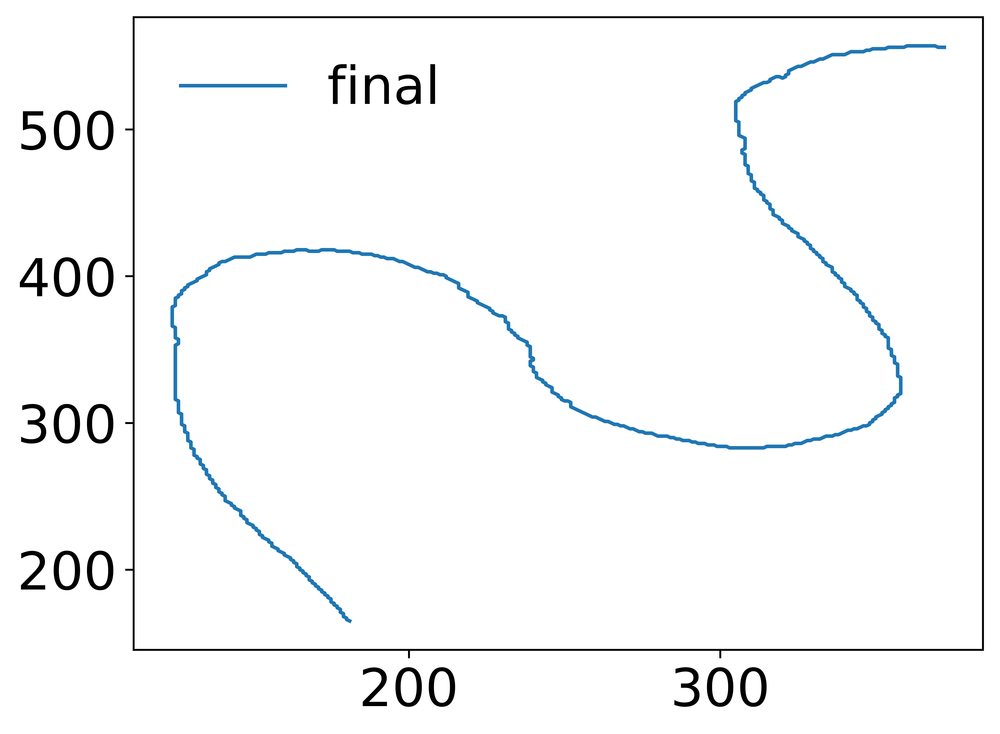

In [22]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend2")
cl1=np.loadtxt('0.2.txt',delimiter=' ')
cl2=np.loadtxt('10.2.txt',delimiter=' ')

y = cl1[:,0][::-1]
x = cl1[:,1][::-1]
y1 = cl2[:,0][::-1]
x1= cl2[:,1][::-1]

plt.plot(x1,y1,label = 'final')
plt.legend(frameon=False)

100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 95.30it/s]

You are running this simulation for: 10.0 Years
Migration rate constant = 200.0 m/yr



/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/456633528.py:34: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  synx = 0.1*chb.channels[np.int(nit-1)].x
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/456633528.py:35: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your

<AxesSubplot:xlabel='x'>

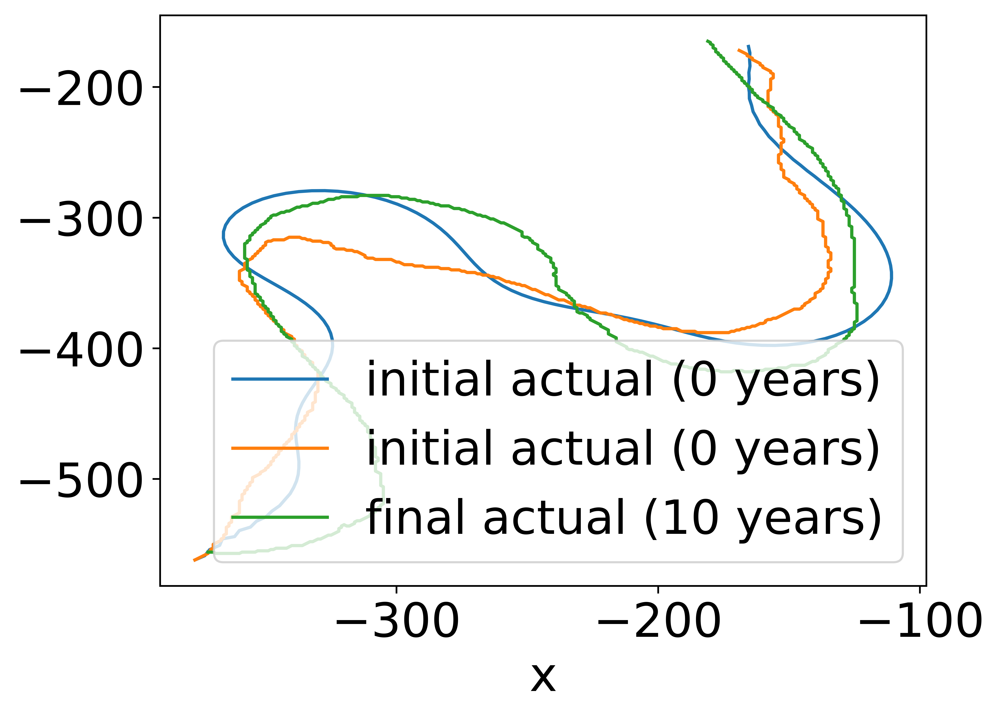

In [23]:
nit = 100                    # number of iterations
W = 100.0                    # channel width (m)
D = 10.0                      # channel depth (m)
depths = D * np.ones((nit,))  # channel depths for different iterations  
pad = 0# padding (number of nodepoints along centerline)
deltas = 50.0                # sampling distance along centerline           
Cfs = 0.02 * np.ones((nit,))
crdist = 1.8 * W               # threshold distance at which cutoffs occur
kl = 200/(365*24*60*60.0)   # migration rate constant (m/s)
kv =  1.0e-12               # vertical slope-dependent erosion rate constant (m/s)
dt = 0.1*(365*24*60*60.0)      # time step (s)
dens = 1000                  # density of water (kg/m3)
saved_ts = 1                # which time steps will be saved
Sl = 0.0                     # initial slope (matters more for submarine channels than rivers)
t1 = 0                    # time step when incision starts
t2 = 0                    # time step when lateral migration starts
t3 = 0     
aggr_factor = 2e-9            # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)
sc = 1.0
y=cl1[:,0]*10
x=cl1[:,1]*10
z=np.zeros(len(x))
H=depths[0]

ch=mp.Channel(-x,-y,z,W,H)
chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration
channel_coordinate = pd.DataFrame({"x":chb.channels[nit-1].x, "y":chb.channels[nit-1].y, "Z":chb.channels[nit-1].z}) # the way it work is this: chb.channels[i].x will give you the x coordinates for the ith time step
np.savetxt('output.txt', channel_coordinate, delimiter=',')

print('You are running this simulation for:', nit*dt/(365.*24*60*60),'Years')
print('Migration rate constant =', kl*60*60.*24.*365., 'm/yr')

synx = 0.1*chb.channels[np.int(nit-1)].x
syny = 0.1*chb.channels[np.int(nit-1)].y

np.savetxt('syn.txt', np.c_[syny,synx])
clsyn=np.loadtxt('syn.txt',delimiter=' ')
ax = pd.DataFrame({"x":clsyn[:,1], "y":clsyn[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)')
pd.DataFrame({"x":-cl1[:,1], "y":-cl1[:,0]}).plot.line(x='x', y='y', ax= ax, label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1], "y":-cl2[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (10 years)')

In [24]:
t = np.linspace(0,1,np.shape(cl1[:,])[0]) # create a new variable t 
x_o = -cl1[:,1].flatten()            # get x-axis data
y_o = -cl1[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,1000)   
xnew_o = fx_o(tnew) + np.random.normal(0,0.1,1000)  # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.1,1000)# create a finer t-variable spacing 
xnew_o = fx_o(tnew)   # get interpolated x values
ynew_o = fy_o(tnew)   # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 2) 
#data_obs_ins =np.flip(data_obs_ins, axis=1)

t = np.linspace(0,1,np.shape(cl2[:,])[0]) # create a new variable t 
x_o = -cl2[:,1].flatten()            # get x-axis data
y_o = -cl2[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,1000)           # create a finer t-variable spacing 
xnew_o = fx_o(tnew)                     # get interpolated x values
ynew_o = fy_o(tnew)
data_obs = np.array([xnew_o,ynew_o])
data_obs = np.flip(data_obs, axis=1)
data_obs = np.round(data_obs, 1)
# modelled

t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
x_m = 0.1*chb.channels[np.int(nit-1)].x
y_m = 0.1*chb.channels[np.int(nit-1)].y
fx_m = interpolate.interp1d(t,x_m)
fy_m = interpolate.interp1d(t, y_m)
tnew = np.linspace(0,1,1000)
xnew_m = fx_m(tnew)
ynew_m = fy_m(tnew)
ynew_ms = ynew_m+np.random.normal(loc=0.0, scale= 0.1, size=1)
xnew_ms = xnew_m+np.random.normal(loc=0.0, scale= 0.1, size=1)
ynew_ms = ynew_m
xnew_ms = xnew_m

/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/458386601.py:28: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/458386601.py:29: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. 

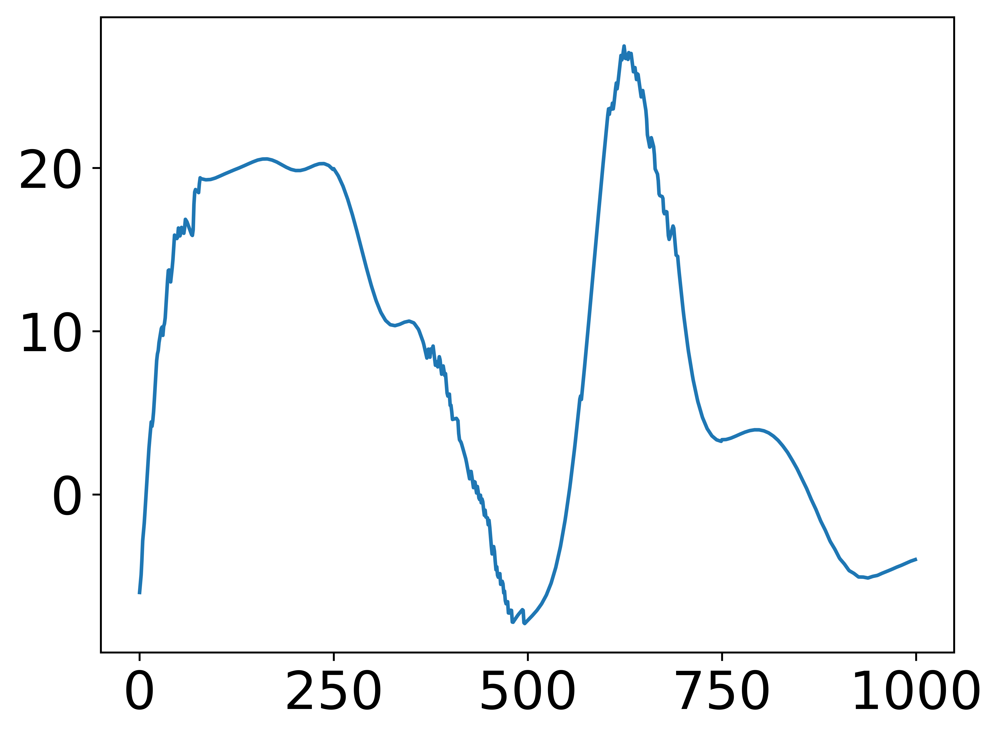

In [25]:
data_obs =np.flip(data_obs, axis=1)
err1 = data_obs_ins[0,:] - data_obs[0,:]
err2 = xnew_ms - data_obs[0,:]
plt.plot(ynew_ms - data_obs[1,:])

In [26]:
nit = 100                   
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0      

def hkm(parm):  
    kl =  (parm[0]*10)/(365*24*60*60.0)  
    Cfs = parm[1] * 0.001 * np.ones((nit,))
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]

    try:    
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = 0.1*chb.channels[np.int(nit-1)].x
            y_m = 0.1*chb.channels[np.int(nit-1)].y

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,1000)
            xnew_m = fx_m(tnew) 
            ynew_m = fy_m(tnew) 
            xnew_m[:] = xnew_m[::-1] 
            ynew_m[:] = ynew_m[::-1] 
        
        else:
            t = np.linspace(0,1,1000)
            xnew_m = np.zeros(1000) 
            ynew_m = np.zeros(1000) 
            ynew_m[:] = ynew_m[::-1] 
            xnew_m[:] = xnew_m[::-1] 

    except:
        t = np.linspace(0,1,1000)
        xnew_m = np.zeros(1000) 
        ynew_m = np.zeros(1000) 
        ynew_m[:] = ynew_m[::-1] 
        xnew_m[:] = xnew_m[::-1] 
        
    return np.array([xnew_m,ynew_m])

[15 20  1]
[15 20  1]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.85it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/115302430.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/115302430.py:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you m

-4467.4664059466595

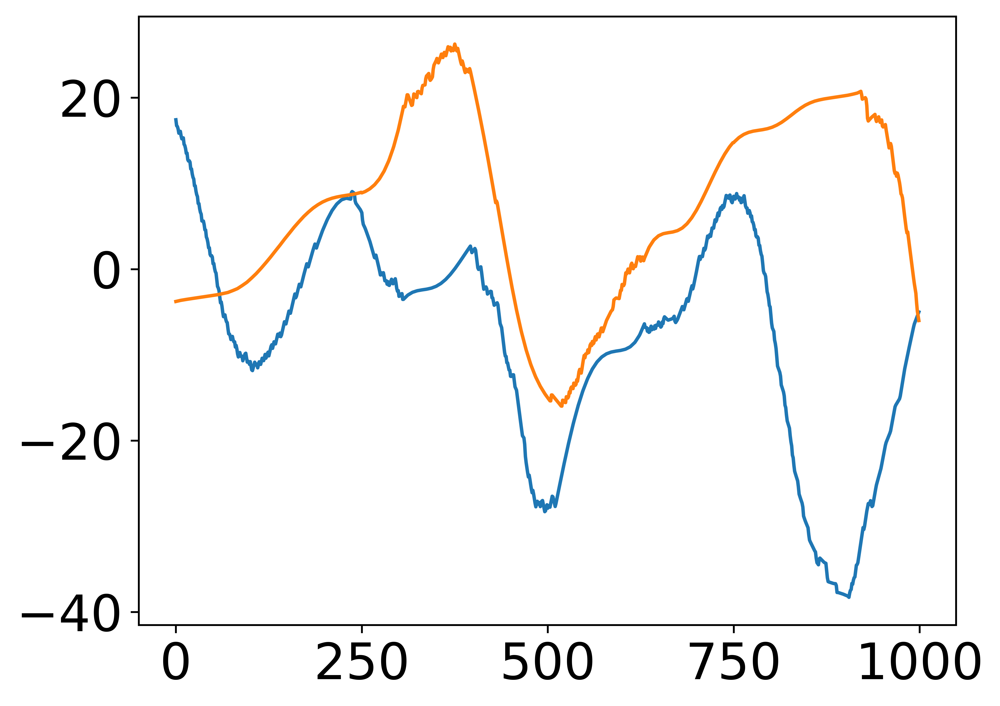

In [27]:
def log_prior(par):
    
    if  10 < par[0] < 50 and 0 < par[1] < 30 and 0.01 < par[2] < 10:   # define the bounds of the prior   
        return -par[2]/1                           # return the exponential distribution
    else:
        return -np.inf
    
def log_lik(par,data):
    print(par)
    sim = hkm(parm=par[:2])
    
    x_err = sim[0,:]-data[0,:][::-1]
    y_err = sim[1,:]-data[1,:][::-1]
    plt.plot(x_err) 
    plt.plot(y_err) 

    y_fft = np.fft.fft(y_err)  # do the fast fourier transform of y-errrors
    x_fft = np.fft.fft(x_err)  # do the fast fourier transform of x-errrors
    
    y_amp1 = 2*abs(y_fft.real/y_fft.size)      # retrieve amplitude of cos function
    y_amp2 = 2*abs(y_fft.imag/y_fft.size)      # retrieve amplitude of sin function
    x_amp1 = 2*abs(x_fft.real/x_fft.size)      # retrieve amplitude of cos function
    x_amp2 = 2*abs(x_fft.imag/x_fft.size)      # retrieve amplitude of sin function
    
    amp = np.array([y_amp1,y_amp2,x_amp1,x_amp2]) # write all four amplitudes in one array 
    
    return np.sum(np.log(stats.norm.pdf(amp, loc=0, scale=par[2]))) # evaluate the probability density of the amp array

def log_post(par, data):
    par = np.around(par, decimals = 0)
    print (par)
    if (log_prior(par)==-np.inf):
        lp = log_prior(par)
    else: 
        lp = log_lik(par,data)+ log_prior(par)
    return lp  

#Test Run
log_post([15,20 ,1],data_obs)

In [28]:
from scipy.stats import truncnorm
import emcee

def get_truncated_normal(mean=0, sd=1, low=0, upp=10):
    return truncnorm(
        (low - mean) / sd, (upp - mean) / sd, loc=mean, scale=sd)

ndim, nwalkers = 3, 50

X1 = get_truncated_normal(mean=10, sd=15, low=0, upp=50)
X2 = get_truncated_normal(mean=5, sd=10, low=0, upp=20)
X3 = get_truncated_normal(mean=2, sd=1, low=1, upp=5)

p0 = np.ones([nwalkers, ndim])
p0[:,0] = X1.rvs(size = nwalkers)
p0[:,1] = X2.rvs(size = nwalkers)
p0[:,2] = X3.rvs(size = nwalkers)
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])

In [29]:
from scipy.stats import truncnorm
import emcee

def get_truncated_normal(mean=0, sd=1, low=0, upp=10):
    return truncnorm(
        (low - mean) / sd, (upp - mean) / sd, loc=mean, scale=sd)

ndim, nwalkers = 3, 50

X1 = get_truncated_normal(mean=15, sd=10, low=1, upp=40)
X2 = get_truncated_normal(mean=10, sd=10, low=1, upp=20)
X3 = get_truncated_normal(mean=2, sd=1, low=1, upp=5)

p0 = np.ones([nwalkers, ndim])
p0[:,0] = X1.rvs(size = nwalkers)
p0[:,1] = X2.rvs(size = nwalkers)
p0[:,2] = X3.rvs(size = nwalkers)
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])

[8. 3. 3.]
[30. 10.  3.]
[30. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.87it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/115302430.py:30: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 1000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/115302430.py:31: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you m

[7. 7. 2.]
[35.  5.  2.]
[35.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.61it/s]


[23. 10.  2.]
[23. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.08it/s]


[7. 4. 3.]
[15.  5.  3.]
[15.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.54it/s]


[ 8. 14.  1.]
[18.  7.  2.]
[18.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.93it/s]


[27. 18.  3.]
[27. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.93it/s]


[11. 12.  2.]
[11. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.56it/s]


[21. 18.  3.]
[21. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.03it/s]


[24.  3.  1.]
[24.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 557.95it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/3400913311.py:27: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(stats.norm.pdf(amp, loc=0, scale=par[2]))) # evaluate the probability density of the amp array


[33. 19.  3.]
[33. 19.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 238.01it/s]


[19. 19.  2.]
[19. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 583.28it/s]


[8. 2. 3.]
[18.  5.  4.]
[18.  5.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.84it/s]


[1. 6. 3.]
[ 5. 15.  2.]
[15. 18.  3.]
[15. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.07it/s]


[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 531.88it/s]


[10.  5.  3.]
[17. 19.  2.]
[17. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 548.81it/s]


[16.  4.  2.]
[16.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 570.98it/s]


[12.  2.  3.]
[12.  2.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.05it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.02it/s]


[22. 18.  3.]
[22. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.35it/s]


[ 7. 11.  1.]
[12.  8.  2.]
[12.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.10it/s]


[ 9. 13.  1.]
[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.51it/s]


[ 9. 15.  2.]
[ 1. 13.  2.]
[3. 5. 3.]
[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.85it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.34it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.79it/s]


[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.54it/s]


[13. 15.  1.]
[13. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.41it/s]


[ 7. 10.  2.]
[29. 10.  2.]
[29. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.85it/s]


[14. 15.  3.]
[14. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.68it/s]


[33. 13.  2.]
[33. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.68it/s]


[18.  7.  3.]
[18.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.90it/s]


[12.  9.  3.]
[12.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.77it/s]


[13.  6.  1.]
[13.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.60it/s]


[25. 17.  2.]
[25. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.76it/s]


[17.  3.  2.]
[17.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.77it/s]


[24. 15.  3.]
[24. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.82it/s]


[10.  8.  1.]
[35.  9.  3.]
[35.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.02it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.10it/s]


[5. 1. 4.]
[1. 4. 3.]
[22. 17.  2.]
[22. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.21it/s]


[12. 11.  2.]
[12. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.22it/s]


[19. 18.  2.]
[19. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.66it/s]


[2. 7. 3.]
[ 3. 16.  2.]
[13. 14.  2.]
[13. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.56it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.76it/s]


[28. 25.  3.]
[28. 25.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.15it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.40it/s]


[10. 12.  1.]
[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.22it/s]


[10. 15.  2.]
[-19.  15.   2.]
[0. 6. 3.]
[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.09it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.57it/s]


[ 8. 10.  2.]
[48. 13.  3.]
[48. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 431.67it/s]


[-2.  2.  3.]
[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.44it/s]


[15.  4.  2.]
[15.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.16it/s]
/Users/braydennoh/opt/anaconda3/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


[-4. -3.  3.]
[2. 9. 3.]
[44.  2.  2.]
[44.  2.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 341.52it/s]


[ 8. 14.  1.]
[24. 10.  2.]
[24. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.97it/s]


[23. 20.  3.]
[23. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.66it/s]


[22.  4.  2.]
[22.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.45it/s]


[27. 18.  2.]
[27. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.48it/s]


[11. -0.  2.]
[19.  4.  4.]
[19.  4.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.09it/s]


[10. 11.  2.]
[8. 2. 3.]
[20. -1.  2.]
[12.  2.  3.]
[12.  2.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.90it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.87it/s]


[6. 8. 0.]
[ 8. 15.  2.]
[18.  7.  1.]
[18.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.69it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.96it/s]


[31.  9.  2.]
[31.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 426.62it/s]


[ 9. 15.  3.]
[17. -2.  4.]
[8. 6. 2.]
[32. 24.  4.]
[32. 24.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.03it/s]


[10.  8.  1.]
[ 6. -1.  3.]
[44.  8.  3.]
[44.  8.  3.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 56.48it/s]


[7. 7. 2.]
[45.  3.  2.]
[45.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.12it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.30it/s]


[34.  7.  2.]
[34.  7.  2.]


100%|█████████████████████████████████████████| 100/100 [00:27<00:00,  3.60it/s]


[33. 18.  3.]
[33. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.04it/s]


[14.  9.  2.]
[14.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.22it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.22it/s]


[19.  1.  1.]
[19.  1.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 735.68it/s]


[38. 22.  3.]
[38. 22.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.14it/s]


[20.  3.  4.]
[20.  3.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.49it/s]


[11. 14.  2.]
[11. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.24it/s]


[12.  5.  2.]
[12.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.99it/s]


[17.  5.  2.]
[17.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.54it/s]


[19. 17.  3.]
[19. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.07it/s]


[ 4. 12.  1.]
[ 7. 21.  0.]
[13.  7.  2.]
[13.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.66it/s]


[20. 20.  1.]
[20. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.46it/s]


[27. 10.  2.]
[27. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.80it/s]


[12.  9.  3.]
[12.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.48it/s]


[13.  6.  1.]
[13.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 738.06it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.61it/s]


[15. 15.  3.]
[15. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.18it/s]


[7. 5. 3.]
[15.  4.  3.]
[15.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.21it/s]


[ 9. 13.  1.]
[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.52it/s]


[ 2. -0.  2.]
[2. 6. 3.]
[11. 16.  2.]
[11. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.15it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.70it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.91it/s]


[12.  1.  3.]
[12.  1.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.60it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.19it/s]


[22.  9.  1.]
[22.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 554.44it/s]


[16. 16.  1.]
[16. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.07it/s]


[-1. 14.  2.]
[ 6. 14.  2.]
[-10.  -3.   4.]
[24. 11.  2.]
[24. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.82it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.85it/s]


[25. 10.  0.]
[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.91it/s]


[15. 15.  3.]
[15. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.32it/s]


[24. 11.  2.]
[24. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.74it/s]


[19.  8.  3.]
[19.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.76it/s]


[16.  2.  1.]
[16.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.11it/s]


[11. 10.  2.]
[11. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.06it/s]


[11.  4.  3.]
[11.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.24it/s]


[15.  5.  2.]
[15.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.32it/s]


[ 5. 19.  1.]
[42. 20.  3.]
[42. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.01it/s]


[ 9. 11.  2.]
[20.  7.  2.]
[20.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.02it/s]


[19. 18.  1.]
[19. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.81it/s]


[7. 2. 3.]
[22.  5.  3.]
[22.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 725.42it/s]


[5. 9. 3.]
[12. 14.  2.]
[12. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.49it/s]


[7. 5. 3.]
[10. 11.  1.]
[22.  8.  1.]
[22.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.75it/s]


[ 9. 13.  1.]
[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.39it/s]


[10. 15.  2.]
[1. 4. 4.]
[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.82it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.43it/s]


[20.  8.  2.]
[20.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.70it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.55it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.69it/s]


[30.  9.  4.]
[30.  9.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.40it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 729.44it/s]


[29. 11.  2.]
[29. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.46it/s]


[1. 7. 3.]
[53.  5.  2.]
[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 717.49it/s]


[7. 4. 3.]
[29.  5.  3.]
[29.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 135.64it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.24it/s]


[40. 21.  3.]
[40. 21.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.38it/s]


[12. 15.  2.]
[12. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.74it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.46it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.07it/s]


[15.  5.  2.]
[15.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 717.39it/s]


[13.  0.  3.]
[15. 11.  2.]
[15. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.81it/s]


[20. 17.  3.]
[20. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.38it/s]


[-5. 12.  3.]
[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.86it/s]


[26. 10.  2.]
[26. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.45it/s]


[16. 17.  3.]
[16. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.74it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.59it/s]


[14.  7.  1.]
[14.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.73it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.96it/s]


[17.  2.  1.]
[17.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 730.21it/s]


[26. 15.  4.]
[26. 15.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.64it/s]


[11.  9.  2.]
[11.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 726.77it/s]


[11.  2.  3.]
[11.  2.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.40it/s]


[36.  9.  2.]
[36.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 249.70it/s]


[-2.  5.  3.]
[41.  2.  2.]
[41.  2.  2.]


100%|█████████████████████████████████████████| 100/100 [00:16<00:00,  6.02it/s]


[24. 11.  3.]
[24. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.52it/s]


[18.  9.  3.]
[18.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.99it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.31it/s]


[21.  8.  2.]
[21.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.08it/s]


[ 3. -6.  3.]
[22.  8.  3.]
[22.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.59it/s]


[-2.  5.  3.]
[11. 15.  2.]
[11. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.80it/s]


[22.  8.  2.]
[22.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.08it/s]


[12.  7.  2.]
[12.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 481.90it/s]


[13.  7.  2.]
[13.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.53it/s]


[12. -6.  3.]
[6. 9. 2.]
[ 8. 12.  1.]
[-7. 12.  2.]
[23. 11.  2.]
[23. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.59it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.86it/s]


[25. 26.  2.]
[25. 26.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.92it/s]


[19.  8.  3.]
[19.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 389.56it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.07it/s]


[16.  2.  1.]
[16.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 471.42it/s]


[7. 3. 4.]
[-3. 15.  1.]
[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.28it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.07it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 421.02it/s]


[28. 20.  3.]
[28. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 420.23it/s]


[18. 22.  1.]
[18. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 425.31it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 579.91it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.42it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.39it/s]


[20. 17.  3.]
[20. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 539.38it/s]


[22.  9.  2.]
[22.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.79it/s]


[22. 19.  1.]
[22. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.16it/s]


[ 6. 20.  2.]
[6. 6. 3.]
[33. 17.  1.]
[33. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 552.58it/s]


[15. 12.  2.]
[15. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.00it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.83it/s]


[16. 18.  1.]
[16. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.18it/s]


[27. 10.  2.]
[27. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.29it/s]


[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.02it/s]


[12. 11.  3.]
[12. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.39it/s]


[21. 17.  2.]
[21. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.92it/s]


[19. 10.  3.]
[19. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 588.72it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.75it/s]


[14.  5.  3.]
[14.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.82it/s]


[5. 7. 2.]
[10.  5.  3.]
[15.  4.  3.]
[15.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.08it/s]


[10. 13.  1.]
[23.  9.  2.]
[23.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.42it/s]


[29. 22.  2.]
[29. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.90it/s]


[10. 10.  3.]
[12. 16.  2.]
[12. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.33it/s]


[11. 12.  2.]
[11. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 559.78it/s]


[12.  7.  2.]
[12.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.02it/s]


[12.  9.  2.]
[12.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 587.53it/s]


[ 9. -5.  4.]
[27.  7.  1.]
[27.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.67it/s]


[ 1. 12.  1.]
[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.89it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.79it/s]


[-18.  15.   2.]
[6. 6. 3.]
[25. 14.  0.]
[23.  9.  1.]
[23.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.43it/s]


[31. 10.  3.]
[31. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.56it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.95it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.82it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.62it/s]


[33. 11.  2.]
[33. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 319.23it/s]


[54.  5.  2.]
[26. 14.  4.]
[26. 14.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.62it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.53it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.42it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.66it/s]


[30. 24.  1.]
[30. 24.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.40it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.97it/s]


[9. 4. 2.]
[37.  9.  2.]
[37.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.95it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.13it/s]


[11. 18.  3.]
[11. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.00it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.20it/s]


[20. 17.  3.]
[20. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.63it/s]


[ 1. 16. -1.]
[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.20it/s]


[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.70it/s]


[28. 17.  1.]
[28. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.00it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.06it/s]


[43.  7.  2.]
[43.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.53it/s]


[28. 32.  2.]
[20.  8.  2.]
[20.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.55it/s]


[16.  7.  1.]
[16.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.59it/s]


[14.  6.  1.]
[14.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.60it/s]


[34. 19.  4.]
[34. 19.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 512.61it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.99it/s]


[7. 7. 2.]
[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.92it/s]


[-17.   0.   4.]
[12. 12.  1.]
[12. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.70it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.76it/s]


[28. 16.  2.]
[28. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.24it/s]


[ 0. -3.  3.]
[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.10it/s]


[22. 19.  2.]
[22. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.82it/s]


[22. 18.  3.]
[22. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 579.37it/s]


[10. 13.  2.]
[21. 19.  2.]
[21. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.92it/s]


[-3. 15.  3.]
[1. 5. 3.]
[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.96it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.91it/s]


[23. 21.  2.]
[23. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 596.43it/s]


[26.  3.  2.]
[26.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.80it/s]


[34.  9.  3.]
[34.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.78it/s]


[14. 12.  3.]
[14. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.93it/s]


[20.  8.  1.]
[20.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.69it/s]


[30. 14.  2.]
[30. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.21it/s]


[17.  8.  1.]
[17.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 555.98it/s]


[24. 15.  3.]
[24. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 447.07it/s]


[14.  6.  3.]
[14.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.30it/s]


[42. -0.  2.]
[13.  6.  2.]
[13.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.95it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 569.59it/s]


[19. 17.  3.]
[19. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 435.25it/s]


[29. 23.  1.]
[29. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.43it/s]


[25.  8.  2.]
[25.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.37it/s]


[22. 15.  1.]
[22. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.96it/s]


[32. 10.  2.]
[32. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.36it/s]


[-5. 11.  3.]
[13. 17.  2.]
[13. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.82it/s]


[11. 11.  2.]
[11. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.74it/s]


[11.  6.  2.]
[11.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.13it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.14it/s]


[ 6. -3.  5.]
[22. 10.  3.]
[22. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.44it/s]


[-0.  9.  1.]
[23.  4.  1.]
[23.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.72it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.60it/s]


[33. 12. -0.]
[25. 13.  2.]
[25. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.53it/s]


[25. 13. -0.]
[25. 29.  2.]
[25. 29.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.00it/s]


[21.  9.  2.]
[21.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.78it/s]


[12.  7.  2.]
[12.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.28it/s]


[12.  1.  4.]
[12.  1.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.59it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.89it/s]


[10.  8.  2.]
[24. 11.  2.]
[24. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.30it/s]


[9. 7. 3.]
[26. 20.  2.]
[26. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.70it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 726.94it/s]


[30. 22.  3.]
[30. 22.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.33it/s]


[41.  9.  3.]
[41.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.81it/s]


[ 6. -0.  2.]
[11. -4.  3.]
[24. 19.  4.]
[24. 19.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.17it/s]


[ 3. 10.  1.]
[23.  9.  1.]
[23.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 723.70it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.27it/s]


[ 2. 13.  2.]
[8. 9. 3.]
[48. 19. -1.]
[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.09it/s]


[22. 22.  2.]
[22. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.58it/s]


[31. 13.  4.]
[31. 13.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.30it/s]


[21.  9.  3.]
[21.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.94it/s]


[19.  8.  1.]
[19.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.73it/s]


[24. 16.  4.]
[24. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.39it/s]


[9. 9. 2.]
[32.  6.  2.]
[32.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.56it/s]


[14.  6.  2.]
[14.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 740.04it/s]


[10. 12.  1.]
[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.75it/s]


[30. 22.  2.]
[30. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.94it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.47it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.75it/s]


[10.  3.  3.]
[-17.   5.   5.]
[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.92it/s]


[11. 12.  2.]
[11. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 723.37it/s]


[14. 12.  1.]
[14. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.88it/s]


[19. 15.  3.]
[19. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.43it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.26it/s]


[17. 10.  2.]
[17. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 729.15it/s]


[11. 14.  1.]
[11. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 729.56it/s]


[ 4. 20.  0.]
[33. 17.  1.]
[33. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 567.28it/s]


[ 9. 14.  2.]
[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 727.74it/s]


[22. 20.  2.]
[22. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.29it/s]


[24. 10.  2.]
[24. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.06it/s]


[16. 12.  3.]
[16. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.91it/s]


[30. 14.  3.]
[30. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.45it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.61it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.02it/s]


[12.  5.  3.]
[12.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 737.48it/s]


[ 5. 15.  1.]
[40. 12.  1.]
[40. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 345.32it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.28it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.02it/s]


[32. 18.  2.]
[32. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.32it/s]


[46.  9.  2.]
[46.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 560.65it/s]


[1. 8. 3.]
[13. 12.  2.]
[13. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.86it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.84it/s]


[16. 10.  2.]
[16. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.03it/s]


[28. 25.  3.]
[28. 25.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.40it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.24it/s]


[16. 15.  0.]
[-3.  1.  4.]
[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.85it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.23it/s]


[25. 13.  3.]
[25. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.59it/s]


[26. 10.  2.]
[26. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.64it/s]


[35. 38.  2.]
[23. 10.  3.]
[23. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.10it/s]


[24. 12.  4.]
[24. 12.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.01it/s]


[28.  6.  1.]
[28.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.28it/s]


[29. 16.  4.]
[29. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.87it/s]


[16.  9.  3.]
[16.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.35it/s]


[11.  9.  2.]
[11.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.40it/s]


[39.  1.  2.]
[39.  1.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 416.16it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.62it/s]


[8. 5. 3.]
[22. 17.  3.]
[22. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.19it/s]


[32. 30.  1.]
[34. 18.  3.]
[34. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.00it/s]


[ 4. -6.  3.]
[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.14it/s]


[12.  3.  3.]
[12.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 565.44it/s]


[25. 13.  2.]
[25. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.22it/s]


[17.  8.  2.]
[17.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 523.41it/s]


[15.  5.  3.]
[15.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 565.87it/s]


[10. 12.  2.]
[ 2. 16.  1.]
[ 7. 17.  2.]
[-3. 14.  2.]
[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 486.40it/s]


[15. 15.  2.]
[15. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.01it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 537.82it/s]


[27. 13.  3.]
[27. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 557.49it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.95it/s]


[20.  6.  1.]
[20.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.10it/s]


[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.04it/s]


[22.  8.  4.]
[22.  8.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.88it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.33it/s]


[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.35it/s]


[12. 15.  2.]
[12. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.72it/s]


[27. 21.  2.]
[27. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.26it/s]


[26. 16.  2.]
[26. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.21it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.21it/s]


[18.  3.  2.]
[18.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 740.51it/s]


[64.  7.  3.]
[2. 7. 3.]
[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.27it/s]


[26. 13.  3.]
[26. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.92it/s]


[15.  6.  3.]
[15.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 734.71it/s]


[31. 23.  5.]
[31. 23.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.34it/s]


[23.  2.  1.]
[23.  2.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 723.52it/s]


[14. 22. -0.]
[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.50it/s]


[-2.  2.  4.]
[24. 11.  2.]
[24. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.40it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.90it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.86it/s]


[21. 19.  2.]
[21. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.40it/s]


[28. 10.  3.]
[28. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.39it/s]


[22. 12.  3.]
[22. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.20it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.48it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.36it/s]


[35.  6.  2.]
[35.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.21it/s]


[23. 12.  3.]
[23. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.31it/s]


[5. 1. 4.]
[24.  6.  2.]
[24.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.72it/s]


[23. 11.  2.]
[23. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.26it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.83it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.78it/s]


[25. 20.  2.]
[25. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.47it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.15it/s]


[12.  3.  3.]
[12.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.99it/s]


[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.61it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.81it/s]


[-4.  4.  0.]
[15. 15.  1.]
[15. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.84it/s]


[-6. 14.  2.]
[23. 13.  0.]
[ 8. 21.  2.]
[19.  7.  2.]
[19.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.47it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.03it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.31it/s]


[21.  8.  1.]
[21.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.42it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.42it/s]


[20. 17.  4.]
[20. 17.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.97it/s]


[2. 8. 2.]
[19. 11.  3.]
[19. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.65it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.68it/s]


[-0. -1.  4.]
[33. 14.  1.]
[33. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.10it/s]


[18. 18.  2.]
[18. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.49it/s]


[29. 23.  1.]
[29. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.22it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.81it/s]


[32. 18.  2.]
[32. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.90it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.86it/s]


[40.  9.  2.]
[40.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.82it/s]


[-0.  6.  3.]
[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.67it/s]


[13.  7.  2.]
[13.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 735.28it/s]


[15.  5.  3.]
[15.  5.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.51it/s]


[18. 16.  3.]
[18. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.27it/s]


[27.  6.  2.]
[27.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.03it/s]


[12. 17.  2.]
[12. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.34it/s]


[31. 17.  0.]
[22. 10.  2.]
[22. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 717.13it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.32it/s]


[36. 13.  3.]
[36. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.88it/s]


[23.  9.  3.]
[23.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.76it/s]


[16. 18.  2.]
[16. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.57it/s]


[30. 12.  2.]
[30. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.35it/s]


[19. 22.  5.]
[19. 22.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.17it/s]


[7. 9. 2.]
[42.  3.  1.]
[42.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.55it/s]


[23. 14.  3.]
[23. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.74it/s]


[14.  6.  2.]
[14.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 729.81it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.58it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.99it/s]


[20.  8.  3.]
[20.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.02it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.33it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.85it/s]


[31. 16.  3.]
[31. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.09it/s]


[35. 13.  2.]
[35. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 252.02it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.63it/s]


[-5.  7. -0.]
[-2. 15.  1.]
[22. 18.  1.]
[22. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.78it/s]


[ 6. 14.  2.]
[-10.  -1.   4.]
[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.33it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.76it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.30it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.01it/s]


[19. 22.  2.]
[19. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.95it/s]


[18.  6.  1.]
[18.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.91it/s]


[17.  9.  1.]
[17.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 457.58it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.20it/s]


[20. 18.  3.]
[20. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 561.40it/s]


[16. 11.  2.]
[16. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.83it/s]


[12.  9.  2.]
[12.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 575.35it/s]


[33.  6.  2.]
[33.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 545.31it/s]


[23. 11.  3.]
[23. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.36it/s]


[ 4. 12.  1.]
[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.09it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.33it/s]


[28. 22.  1.]
[28. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.45it/s]


[21. 14.  3.]
[21. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.01it/s]


[33. 13.  2.]
[33. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.05it/s]


[9. 5. 3.]
[19. 10.  2.]
[19. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.48it/s]


[18. 15.  3.]
[18. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.37it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.17it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.90it/s]


[-6. 13.  2.]
[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.79it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 723.16it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.54it/s]


[34. 10.  3.]
[34. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.10it/s]


[ 4. 10.  3.]
[42. 16.  1.]
[42. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.84it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.51it/s]


[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.26it/s]


[3. 3. 4.]
[22.  6.  2.]
[22.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.96it/s]


[15. 14.  2.]
[15. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.86it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.77it/s]


[18. -1.  2.]
[50.  9.  2.]
[-1.  5.  3.]
[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.00it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.32it/s]


[15. 11.  1.]
[15. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.28it/s]


[23. 14.  3.]
[23. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.37it/s]


[17.  7.  2.]
[17.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.49it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.32it/s]


[-4. 10.  1.]
[23.  8.  1.]
[23.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.72it/s]


[ 7. 18.  1.]
[8. 7. 3.]
[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.07it/s]


[25. 17.  1.]
[25. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.01it/s]


[19. 17.  3.]
[19. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.20it/s]


[23. 12.  3.]
[23. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.77it/s]


[21. 19.  2.]
[21. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.44it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.45it/s]


[21.  8.  1.]
[21.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.93it/s]


[29. 16.  4.]
[29. 16.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.81it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.93it/s]


[31. 13.  2.]
[31. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.16it/s]


[ 9. 11.  2.]
[5. 4. 3.]
[12. 11.  1.]
[12. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.84it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.83it/s]


[11. 17.  2.]
[11. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.15it/s]


[29. 18.  3.]
[29. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.83it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.67it/s]


[19. -2.  3.]
[ 7. 10.  3.]
[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.65it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.04it/s]


[15.  8.  2.]
[15.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.76it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.51it/s]


[21. 15.  3.]
[21. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.27it/s]


[13. 11.  1.]
[13. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.84it/s]


[-32.   2.   4.]
[20.  9.  2.]
[20.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.80it/s]


[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.40it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.36it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.48it/s]


[20. -3. -1.]
[19.  9.  1.]
[19.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.76it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.10it/s]


[38.  3.  2.]
[38.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.78it/s]


[24. 13.  3.]
[24. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.68it/s]


[15.  6.  2.]
[15.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.73it/s]


[27. 15.  2.]
[27. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.06it/s]


[35. 36.  2.]
[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.17it/s]


[49.  8.  2.]
[49.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.94it/s]


[13. 13.  2.]
[13. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.86it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.32it/s]


[25. 13.  2.]
[25. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.43it/s]


[16.  6.  3.]
[16.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.93it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.03it/s]


[16.  9.  1.]
[16.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.88it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.85it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.53it/s]


[ 9. 14.  2.]
[39. 16.  0.]
[26. 12.  0.]
[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.63it/s]


[24. 11.  3.]
[24. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.44it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.62it/s]


[27. 12.  2.]
[27. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.25it/s]


[23.  9.  3.]
[23.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.98it/s]


[47. 17.  1.]
[47. 17.  1.]


100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 95.86it/s]


[32. 18.  5.]
[32. 18.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.28it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.98it/s]


[9. 9. 2.]
[28. 10.  2.]
[28. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 402.59it/s]


[14.  3.  2.]
[14.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.04it/s]


[21. 17.  3.]
[21. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 540.40it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 538.01it/s]


[27. 20.  2.]
[27. 20.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.34it/s]


[28. 16.  3.]
[28. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 476.05it/s]


[16. -2.  3.]
[42.  9.  2.]
[42.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 386.05it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 449.88it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.33it/s]


[17.  7.  2.]
[17.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.37it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.58it/s]


[14. 15.  2.]
[14. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.93it/s]


[2. 5. 3.]
[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.86it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.10it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.56it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.03it/s]


[29. 10.  3.]
[29. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.64it/s]


[19.  5.  0.]
[69. 19.  1.]
[20. 10.  2.]
[20. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.85it/s]


[23. 15.  3.]
[23. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.86it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.70it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.39it/s]


[-1.  1.  4.]
[ 6. 10.  0.]
[32. 14.  1.]
[32. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.15it/s]


[27. 14.  2.]
[27. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.98it/s]


[29. 17.  1.]
[29. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.62it/s]


[-9.  1.  3.]
[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.73it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.19it/s]


[32. 17.  3.]
[32. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 585.81it/s]


[16.  7.  3.]
[16.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.47it/s]


[2. 9. 2.]
[25. 23.  4.]
[25. 23.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.28it/s]


[13.  9.  1.]
[13.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.81it/s]


[20.  8.  2.]
[20.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.22it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.79it/s]


[10. 13.  2.]
[12. 14.  1.]
[12. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.10it/s]


[15. 17.  2.]
[15. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.59it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.65it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.06it/s]


[21.  9.  2.]
[21.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.87it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.00it/s]


[16. 17.  1.]
[16. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.94it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.53it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.22it/s]


[27. 10.  2.]
[27. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.76it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.14it/s]


[ 1. -1.  4.]
[12.  3.  3.]
[12.  3.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.36it/s]


[25. 12.  1.]
[25. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.64it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.63it/s]


[23. 16.  1.]
[23. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.59it/s]


[18.  4.  2.]
[18.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 717.22it/s]


[49.  8.  2.]
[49.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.91it/s]


[3. 7. 3.]
[22. 14.  3.]
[22. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.72it/s]


[16.  9.  2.]
[16.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.87it/s]


[17.  9.  2.]
[17.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.27it/s]


[21. 15.  3.]
[21. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.31it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.58it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.53it/s]


[12. 17.  1.]
[12. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.06it/s]


[-15.  13.   3.]
[11. 12.  2.]
[11. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.84it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.19it/s]


[22. 10.  2.]
[22. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.19it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.47it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.08it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.43it/s]


[13. 12.  1.]
[13. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.34it/s]


[18. 18.  3.]
[18. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.86it/s]


[37. 27.  1.]
[37. 27.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.20it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.47it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.57it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.16it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.01it/s]


[25. 13.  2.]
[25. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.82it/s]


[16.  8.  2.]
[16.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.66it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.27it/s]


[23. 10.  1.]
[23. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.24it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.25it/s]


[-12.  -3.   4.]
[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.66it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.76it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.16it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.14it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.29it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.71it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.75it/s]


[21.  8.  1.]
[21.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.15it/s]


[29. 11.  2.]
[29. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.43it/s]


[23. 15.  3.]
[23. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.25it/s]


[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.79it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.96it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 546.28it/s]


[27. 10.  2.]
[27. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 453.70it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.56it/s]


[26. 10.  3.]
[26. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.14it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 561.88it/s]


[59.  7.  3.]
[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.70it/s]


[14.  7.  1.]
[14.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 524.91it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 549.87it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 545.96it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 525.99it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.30it/s]


[17. 12.  0.]
[ 2. 14.  2.]
[9. 8. 3.]
[32. 15.  0.]
[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.54it/s]


[10. 17.  2.]
[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 612.86it/s]


[22. 15.  2.]
[22. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 566.26it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 371.80it/s]


[46. 17.  1.]
[46. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 554.57it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.38it/s]


[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.28it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.01it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.26it/s]


[10.  8.  3.]
[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.32it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.39it/s]


[28. 15.  2.]
[28. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.21it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.26it/s]


[31. 26.  1.]
[31. 26.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.81it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.79it/s]


[7. 2. 2.]
[-9.  6.  3.]
[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.50it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.08it/s]


[31.  9.  2.]
[31.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 435.53it/s]


[16.  6.  2.]
[16.  6.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.84it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.36it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.78it/s]


[ 7. 19.  1.]
[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.68it/s]


[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.96it/s]


[26. 13.  3.]
[26. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.31it/s]


[28. 11.  3.]
[28. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.22it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.38it/s]


[21.  8.  1.]
[21.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.93it/s]


[23. 15.  3.]
[23. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.55it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.83it/s]


[4. 3. 3.]
[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.30it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.52it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.28it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.24it/s]


[18.  4.  2.]
[18.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.13it/s]


[57.  6.  2.]
[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.30it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.88it/s]


[20. 21.  1.]
[20. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.12it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.61it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.08it/s]


[ 8. 13.  2.]
[6. 6. 3.]
[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.88it/s]


[12. 13.  2.]
[12. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.49it/s]


[25. 12.  1.]
[25. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.68it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.32it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.76it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.43it/s]


[40. 15.  1.]
[40. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.85it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.77it/s]


[24. 17.  5.]
[24. 17.  5.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.54it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.71it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.80it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.99it/s]


[27. 11.  2.]
[27. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.61it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.07it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.80it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.54it/s]


[27. 20.  1.]
[27. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.86it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.06it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.68it/s]


[8. 8. 2.]
[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.19it/s]


[12. 11.  0.]
[10.  4.  1.]
[31. 16.  2.]
[31. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.04it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.05it/s]


[16.  4.  3.]
[16.  4.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.25it/s]


[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.36it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.97it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.93it/s]


[21. 12.  0.]
[11. 12.  2.]
[11. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.40it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.40it/s]


[24. 11.  3.]
[24. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.61it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.85it/s]


[20.  6.  0.]
[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.38it/s]


[14.  6.  3.]
[14.  6.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 733.71it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.64it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.31it/s]


[28. 21.  1.]
[28. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.70it/s]


[23. 10.  2.]
[23. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.75it/s]


[19. 14.  3.]
[19. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.30it/s]


[35. 10.  2.]
[35. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.98it/s]


[-6.  5.  3.]
[21. 13.  3.]
[21. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.89it/s]


[18. 15.  2.]
[18. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.88it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 464.99it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 542.92it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.83it/s]


[16. 16.  3.]
[16. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.33it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 536.93it/s]


[14. 13.  2.]
[14. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.33it/s]


[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 548.50it/s]


[1. 5. 3.]
[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 548.09it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 557.33it/s]


[25. 10.  3.]
[25. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.36it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.66it/s]


[39. 15.  1.]
[39. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 491.69it/s]


[24. 14.  3.]
[24. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.86it/s]


[22.  9.  3.]
[22.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.56it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.35it/s]


[32.  9.  2.]
[32.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.64it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.59it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.08it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.14it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.61it/s]


[31. 15.  1.]
[31. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 550.29it/s]


[19.  5.  2.]
[19.  5.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 728.41it/s]


[27. 11.  1.]
[27. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.97it/s]


[25. 12.  3.]
[25. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.49it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.48it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.21it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.99it/s]


[ 2. 13.  2.]
[27. 11.  1.]
[27. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.41it/s]


[26. 18. -0.]
[14. 16.  2.]
[14. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.56it/s]


[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.97it/s]


[39. 19.  1.]
[39. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.74it/s]


[23. 14.  2.]
[23. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.70it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.54it/s]


[20.  7.  1.]
[20.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 723.58it/s]


[19.  7.  1.]
[19.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 728.09it/s]


[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.12it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.74it/s]


[28. 10.  2.]
[28. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.69it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.03it/s]


[17.  8.  3.]
[17.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.77it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.14it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.50it/s]


[29. 21.  1.]
[29. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.43it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.71it/s]


[1. 3. 3.]
[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.44it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.83it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.25it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.06it/s]


[ 8. 15.  1.]
[11.  7.  3.]
[11.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 730.20it/s]


[26. 13. -0.]
[13. 16.  2.]
[13. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.12it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.46it/s]


[26. 16.  2.]
[26. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.17it/s]


[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.38it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.80it/s]


[17.  3.  1.]
[17.  3.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.53it/s]


[36. 15.  1.]
[36. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 581.96it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.64it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.02it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.83it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.26it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.47it/s]


[20.  7.  1.]
[20.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.76it/s]


[21. 16.  2.]
[21. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.40it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.15it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.02it/s]


[17.  3.  2.]
[17.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.18it/s]


[65.  5.  3.]
[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.50it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.64it/s]


[28. 10.  1.]
[28. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.62it/s]


[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.84it/s]


[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.94it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.14it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.36it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.59it/s]


[30. 21.  0.]
[ 9. 13.  2.]
[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.32it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.65it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.06it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.00it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.55it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.67it/s]


[22. 16.  1.]
[22. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.90it/s]


[27. 10.  2.]
[27. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.67it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.75it/s]


[16.  7.  3.]
[16.  7.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.83it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.30it/s]


[26. 12.  1.]
[26. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.18it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.26it/s]


[-13.   3.   4.]
[29. 10.  1.]
[29. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.03it/s]


[16.  8.  1.]
[16.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.71it/s]


[26. 13.  3.]
[26. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 440.54it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 546.15it/s]


[17. 18.  2.]
[17. 18.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.46it/s]


[19. 25.  1.]
[19. 25.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.68it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.87it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.63it/s]


[ 0. 13.  2.]
[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 554.44it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.24it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 522.60it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.00it/s]


[16. 12.  1.]
[16. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.73it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.74it/s]


[39. 13.  2.]
[39. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.98it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.62it/s]


[20. 10.  3.]
[20. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.68it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.61it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.98it/s]


[23. 20.  3.]
[23. 20.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.95it/s]


[27. 20.  1.]
[27. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.36it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.63it/s]


[28. 15.  2.]
[28. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.75it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.23it/s]


[19.  3.  2.]
[19.  3.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.51it/s]


[34. 10.  2.]
[34. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.92it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.37it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.07it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.11it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.73it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.17it/s]


[15. 13.  1.]
[15. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.15it/s]


[14. 10.  2.]
[14. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.32it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.53it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.61it/s]


[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.00it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.85it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.31it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.88it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.54it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.27it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.48it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.74it/s]


[18.  9.  2.]
[18.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.54it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.94it/s]


[31. 23.  1.]
[31. 23.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 569.59it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.75it/s]


[19.  4.  2.]
[19.  4.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.31it/s]


[51.  8.  3.]
[50.  8.  1.]
[15.  9.  1.]
[15.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.46it/s]


[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 603.10it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.50it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.43it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.66it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.61it/s]


[30. 16.  0.]
[ 9. 19.  1.]
[25. 12.  1.]
[25. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.90it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.98it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.79it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.86it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.77it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.95it/s]


[24.  4.  1.]
[24.  4.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.25it/s]


[29. 14.  1.]
[29. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.80it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.72it/s]


[28. 10.  2.]
[28. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.12it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.09it/s]


[19. 15.  3.]
[19. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.41it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.79it/s]


[25. 17.  1.]
[25. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.16it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.59it/s]


[22.  9.  3.]
[22.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.02it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.90it/s]


[4. 8. 3.]
[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.80it/s]


[16. 15.  2.]
[16. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 717.78it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.90it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.98it/s]


[19. 15.  3.]
[19. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.25it/s]


[12. 10.  2.]
[12. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.31it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.62it/s]


[-12.  13.   2.]
[13. 10.  2.]
[13. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.27it/s]


[28. 18.  0.]
[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.30it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.05it/s]


[13.  9.  1.]
[13.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.11it/s]


[13. 15.  2.]
[13. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.62it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.21it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.27it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.34it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.54it/s]


[34.  8.  2.]
[34.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.42it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 444.89it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 435.68it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 499.58it/s]


[22. 10.  2.]
[22. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.64it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 473.21it/s]


[19.  7.  2.]
[19.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.22it/s]


[-1.  6.  3.]
[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.58it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 504.49it/s]


[24. 13.  3.]
[24. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 510.26it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 565.73it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.96it/s]


[-3. 13.  2.]
[12.  8.  3.]
[12.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.47it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.86it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.66it/s]


[32.  9.  2.]
[32.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.13it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.38it/s]


[25.  9.  1.]
[25.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.53it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.69it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.79it/s]


[17.  8.  3.]
[17.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.98it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.11it/s]


[ 9. 13.  2.]
[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.06it/s]


[25. 18.  1.]
[25. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.55it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 618.93it/s]


[45.  9.  2.]
[45.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 259.06it/s]


[21. 12.  3.]
[21. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.59it/s]


[26. 11.  2.]
[26. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.17it/s]


[25. 13.  3.]
[25. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.33it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.83it/s]


[17. 16.  3.]
[17. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.17it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.53it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.57it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.94it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.88it/s]


[12. 17.  2.]
[12. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.51it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.55it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.00it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.96it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.94it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.04it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.05it/s]


[29. 14.  1.]
[29. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 621.12it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.32it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.26it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.58it/s]


[20. 16.  3.]
[20. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.95it/s]


[18. 10.  2.]
[18. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.51it/s]


[23. 16.  3.]
[23. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.36it/s]


[27. 21.  1.]
[27. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.09it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.86it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.70it/s]


[-9.  4.  3.]
[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.94it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.08it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.24it/s]


[22. 15.  1.]
[22. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.87it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.88it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.47it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.54it/s]


[-8. 13.  3.]
[21. 17.  1.]
[21. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.87it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.33it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.29it/s]


[21. 12.  3.]
[21. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.55it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.28it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.09it/s]


[16. 13.  1.]
[16. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.45it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.30it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.21it/s]


[28. 10.  2.]
[28. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.15it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.54it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.09it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.26it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.08it/s]


[22. 13.  3.]
[22. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.83it/s]


[19.  9.  2.]
[19.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.83it/s]


[46.  9.  2.]
[46.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 567.60it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.28it/s]


[26. 11.  1.]
[26. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.70it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.87it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.86it/s]


[22. 14.  0.]
[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.82it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.93it/s]


[10.  9.  3.]
[27. 11.  0.]
[17. 15.  2.]
[17. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.60it/s]


[34. 17.  1.]
[34. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.92it/s]


[24. 11.  3.]
[24. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.75it/s]


[28.  6.  1.]
[28.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 434.02it/s]


[27. 14.  1.]
[27. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 447.10it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.28it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.06it/s]


[30.  9.  2.]
[30.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 456.93it/s]


[13.  9.  2.]
[13.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.87it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 498.81it/s]


[41. 17.  3.]
[41. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 387.08it/s]


[31. 12.  2.]
[31. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 506.21it/s]


[28. 11.  2.]
[28. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.82it/s]


[19. 13.  3.]
[19. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.18it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.94it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.56it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.46it/s]


[ 8. 12.  1.]
[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.72it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.46it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.79it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.81it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.44it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.58it/s]


[27. 12.  1.]
[27. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.92it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.86it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.23it/s]


[23. 15.  3.]
[23. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.96it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.83it/s]


[32. 14.  2.]
[32. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 605.86it/s]


[-3. 14.  1.]
[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.71it/s]


[22. 11.  2.]
[22. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.42it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.26it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.66it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.82it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.79it/s]


[24. 14.  1.]
[24. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.82it/s]


[28. 21.  2.]
[28. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.22it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.30it/s]


[48.  8.  2.]
[48.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.47it/s]


[-9.  4.  3.]
[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.72it/s]


[24. 13.  4.]
[24. 13.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.54it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.14it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.73it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.73it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.11it/s]


[ 8. 14.  2.]
[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.72it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.38it/s]


[33. 16.  2.]
[33. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.61it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.19it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.63it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.60it/s]


[28.  8.  1.]
[28.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 604.88it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.43it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.13it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.77it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.23it/s]


[24. 21.  1.]
[24. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.09it/s]


[28. 10.  2.]
[28. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.33it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.98it/s]


[19.  8.  2.]
[19.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.20it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.01it/s]


[25. 10.  1.]
[25. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.27it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.09it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.81it/s]


[26. 15.  2.]
[26. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.57it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.41it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.02it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.87it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.43it/s]


[24. 12.  0.]
[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.90it/s]


[23. 15.  1.]
[23. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.20it/s]


[38. 18.  1.]
[38. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 583.14it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.87it/s]


[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.00it/s]


[16. 13.  2.]
[16. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.57it/s]


[14. 14.  2.]
[14. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.17it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.26it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.15it/s]


[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.97it/s]


[27. 11.  2.]
[27. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.88it/s]


[10.  7.  3.]
[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.06it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.90it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.14it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.16it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.33it/s]


[43.  9.  2.]
[43.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 336.76it/s]


[9. 9. 2.]
[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.00it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.36it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 388.01it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 428.85it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.09it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 543.68it/s]


[10. 12.  2.]
[18. 14.  2.]
[18. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.38it/s]


[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 516.66it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 477.84it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 520.66it/s]


[25.  9.  1.]
[25.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 519.47it/s]


[27. 14.  1.]
[27. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.61it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.58it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.14it/s]


[34.  9.  3.]
[34.  9.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.08it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.61it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.75it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.66it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.17it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.71it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.95it/s]


[11. 10.  3.]
[11. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.47it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.97it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.57it/s]


[26. 11.  1.]
[26. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.27it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.25it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.15it/s]


[ 3. 13.  2.]
[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.45it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.92it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.32it/s]


[47. 21.  1.]
[47. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 452.50it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.84it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.70it/s]


[24. 15.  2.]
[24. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.82it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.26it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.17it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.11it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.30it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.70it/s]


[19. 15.  3.]
[19. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.08it/s]


[20. 17.  2.]
[20. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.64it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.90it/s]


[27. 21.  1.]
[27. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.80it/s]


[26. 10.  3.]
[26. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.02it/s]


[21. 10.  2.]
[21. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.78it/s]


[57.  6.  3.]
[10.  7.  1.]
[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.50it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.70it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.39it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.68it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.86it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.94it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.36it/s]


[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.63it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.34it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.86it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.73it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.09it/s]


[26.  9.  1.]
[26.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.16it/s]


[32. 14.  2.]
[32. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.17it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.71it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.34it/s]


[33.  9.  2.]
[33.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.13it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.78it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.47it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 587.31it/s]


[21. 14.  3.]
[21. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.75it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.14it/s]


[37. 10.  2.]
[37. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.59it/s]


[15. 11.  3.]
[15. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.92it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.04it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 717.44it/s]


[23. 11.  2.]
[23. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.09it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.96it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.34it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.66it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.25it/s]


[17. 12.  2.]
[17. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.62it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.68it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.16it/s]


[26. 11.  0.]
[23. 14.  2.]
[23. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.54it/s]


[33. 17.  1.]
[33. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 561.25it/s]


[22. 12.  3.]
[22. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.07it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.77it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.85it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.50it/s]


[10.  7.  1.]
[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.35it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.66it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.75it/s]


[22. 17.  3.]
[22. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.31it/s]


[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 444.04it/s]


[24. 11.  2.]
[24. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.22it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.67it/s]


[20. 16.  2.]
[20. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 513.87it/s]

[20. 12.  2.]
[20. 12.  2.]



100%|████████████████████████████████████████| 100/100 [00:00<00:00, 532.10it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 493.65it/s]


[ 4. 12.  1.]
[16. 10.  1.]
[16. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.55it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.47it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 562.37it/s]


[-14.  13.   2.]
[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 566.56it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.17it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.51it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.88it/s]


[28.  6.  1.]
[28.  6.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.57it/s]


[29. 14.  2.]
[29. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.54it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 419.25it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.22it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.35it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.07it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.49it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.56it/s]


[20. 17.  3.]
[20. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.46it/s]


[15. 21.  1.]
[15. 21.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.16it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.67it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.76it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.29it/s]


[48.  8.  2.]
[48.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.00it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.91it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.29it/s]


[18.  9.  1.]
[18.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.51it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.84it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.73it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.96it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.55it/s]


[-5. 13.  2.]
[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.12it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.62it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.48it/s]


[19. 13.  3.]
[19. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.75it/s]


[31.  7.  1.]
[31.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.77it/s]


[30. 15.  2.]
[30. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 232.87it/s]


[18. 17.  4.]
[18. 17.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.79it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.90it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.79it/s]


[31.  7.  2.]
[31.  7.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 755.50it/s]


[21. 10.  3.]
[21. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.91it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.46it/s]


[19. 15.  2.]
[19. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.87it/s]


[25. 11.  1.]
[25. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.68it/s]


[18. 16.  2.]
[18. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.21it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.36it/s]


[23. 14.  2.]
[23. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.19it/s]


[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.86it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.32it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.11it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.24it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.04it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.58it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.15it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.55it/s]


[36. 18.  1.]
[36. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.33it/s]


[15. 10.  1.]
[15. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.36it/s]


[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.37it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.44it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.30it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.31it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.38it/s]


[9. 7. 2.]
[13.  8.  1.]
[13.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 731.00it/s]


[23. 17.  3.]
[23. 17.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.02it/s]


[30.  9.  1.]
[30.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.22it/s]


[23. 12.  3.]
[23. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.80it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.51it/s]


[41. 13.  2.]
[41. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.39it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.84it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.45it/s]


[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.35it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.32it/s]


[22. 12.  3.]
[22. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.42it/s]


[28. 13.  3.]
[28. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.63it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.62it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.82it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.13it/s]


[ 7. 12.  2.]
[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.70it/s]


[22. 13.  0.]
[26. 14.  1.]
[26. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.78it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.22it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.73it/s]


[28. 14.  1.]
[28. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.04it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.39it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.19it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 557.45it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.42it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 614.20it/s]


[27. 10.  2.]
[27. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.40it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.43it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.70it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.21it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.42it/s]


[16. 22.  1.]
[16. 22.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.09it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.90it/s]


[15. 10.  2.]
[15. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.17it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.29it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.13it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.04it/s]


[18. 12.  1.]
[18. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.02it/s]


[17. 13.  1.]
[17. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.22it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.37it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.48it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.41it/s]


[30. 15.  1.]
[30. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 218.95it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.42it/s]


[29. 13.  2.]
[29. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.12it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.43it/s]


[24. 10.  2.]
[24. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.88it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.33it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.16it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.07it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.22it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.80it/s]


[17. 19.  1.]
[17. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.40it/s]


[29. 11.  1.]
[29. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.09it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.04it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.13it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.38it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.89it/s]


[22. 13.  3.]
[22. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.76it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.12it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.42it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.17it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.27it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.55it/s]


[28. 10.  1.]
[28. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.40it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.71it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.16it/s]


[34. 17.  2.]
[34. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.43it/s]


[23. 12.  3.]
[23. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.66it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 725.64it/s]


[30. 12.  2.]
[30. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.36it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.13it/s]


[21. 15.  3.]
[21. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.75it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.14it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.63it/s]


[22.  9.  2.]
[22.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.83it/s]


[15.  8.  1.]
[15.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.27it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.87it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.57it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.52it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.18it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.95it/s]


[40.  9.  2.]
[40.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 492.05it/s]


[14. 10.  3.]
[14. 10.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 725.99it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.35it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.04it/s]


[23. 17.  1.]
[23. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.68it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.83it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.22it/s]


[10. 13.  2.]
[21. 13.  0.]
[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.67it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.67it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.18it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.52it/s]


[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.51it/s]


[20.  9.  1.]
[20.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.38it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.99it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.73it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.00it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.52it/s]


[21. 14.  0.]
[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.90it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.14it/s]


[24. 13.  3.]
[24. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.44it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.63it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.38it/s]


[49.  8.  2.]
[49.  8.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.59it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.49it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.86it/s]


[21. 13.  3.]
[21. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.84it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.12it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.62it/s]


[16. 11.  1.]
[16. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.69it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.19it/s]


[26. 12.  1.]
[26. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.19it/s]


[35. 17.  1.]
[35. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 508.41it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 518.52it/s]


[20. 13.  3.]
[20. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 571.88it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 551.09it/s]


[25.  9.  1.]
[25.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 549.31it/s]


[29. 13.  1.]
[29. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 579.80it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 533.79it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 600.19it/s]


[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.92it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.65it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 555.60it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.59it/s]


[22. 18.  3.]
[22. 18.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.98it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.72it/s]


[18. 12.  2.]
[18. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.03it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.12it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.98it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.63it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.90it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.57it/s]


[17. 15.  1.]
[17. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.64it/s]


[-2. 16. -0.]
[-3. 13.  2.]
[28.  9.  1.]
[28.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.11it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.59it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.76it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.50it/s]


[24. 15.  2.]
[24. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.64it/s]


[22. 12.  3.]
[22. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.34it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.03it/s]


[13.  9.  1.]
[13.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.69it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.57it/s]


[27. 12.  2.]
[27. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.53it/s]


[22. 11.  0.]
[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.24it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.19it/s]


[21. 14.  0.]
[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.33it/s]


[23. 14.  2.]
[23. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.78it/s]


[19. 16.  2.]
[19. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.13it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.24it/s]


[41.  9.  2.]
[41.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.04it/s]


[16. 12.  2.]
[16. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.64it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.23it/s]


[25. 10.  2.]
[25. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.95it/s]


[24. 14.  3.]
[24. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.91it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.12it/s]


[19. 15.  1.]
[19. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.99it/s]


[21. 15.  1.]
[21. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.84it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.55it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.17it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.58it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.25it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.62it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.06it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.93it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.39it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.95it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.95it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.82it/s]


[19. 16.  3.]
[19. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.57it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.41it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.43it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.49it/s]


[20. 13.  3.]
[20. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.36it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.63it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.35it/s]


[22. 16.  0.]
[20. 15.  3.]
[20. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.99it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.06it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.15it/s]


[-18.  14.   3.]
[31.  7.  1.]
[31.  7.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.92it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 610.57it/s]


[27. 15.  1.]
[27. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 607.21it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.86it/s]


[37. 18.  1.]
[37. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.03it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.99it/s]


[28. 12.  2.]
[28. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.70it/s]


[25.  8.  3.]
[25.  8.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.97it/s]


[25.  9.  1.]
[25.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.17it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.75it/s]


[26. 14.  1.]
[26. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.90it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.06it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.59it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.67it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.40it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.45it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.95it/s]


[45.  9.  2.]
[45.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 251.20it/s]


[26. 14.  2.]
[26. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.06it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.85it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.11it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 433.08it/s]


[25. 13.  2.]
[25. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 484.13it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.16it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 444.02it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 479.31it/s]


[-2. 13.  2.]
[31.  8.  1.]
[31.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 480.53it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 474.33it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.15it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.27it/s]


[27. 14.  1.]
[27. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.67it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.80it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.18it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.04it/s]


[25. 11.  2.]
[25. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.39it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.14it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.52it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.12it/s]


[22. 15.  2.]
[22. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.26it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.74it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.19it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.83it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.82it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.40it/s]


[26. 12.  1.]
[26. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.50it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.44it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.16it/s]


[21. 16.  3.]
[21. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.00it/s]


[18. 15.  1.]
[18. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.81it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.61it/s]


[23. 11.  1.]
[23. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.74it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.92it/s]


[24. 14.  0.]
[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.15it/s]


[37. 19.  1.]
[37. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.01it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.19it/s]


[23. 13.  3.]
[23. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.33it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.48it/s]


[25.  9.  1.]
[25.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.31it/s]


[26. 14.  1.]
[26. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.98it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.17it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.22it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.81it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.74it/s]


[22. 13.  0.]
[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.38it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.27it/s]


[19. 17.  1.]
[19. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.41it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.91it/s]


[57.  7.  3.]
[20. 14.  3.]
[20. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.25it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.38it/s]


[15. 11.  0.]
[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.26it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 717.30it/s]


[-8. 13.  2.]
[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.03it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.79it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.36it/s]


[47. 22.  2.]
[47. 22.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.55it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.58it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.83it/s]


[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.08it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.65it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.69it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.28it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.20it/s]


[24. 11.  3.]
[24. 11.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.35it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.46it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.98it/s]


[28. 15.  2.]
[28. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.80it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.75it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.91it/s]


[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.53it/s]


[17. 12.  1.]
[17. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.80it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.19it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.55it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 599.51it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 594.56it/s]


[14. 14.  1.]
[14. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.12it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.87it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 627.89it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.97it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.88it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.15it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.15it/s]


[27.  8.  1.]
[27.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.28it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.61it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.55it/s]


[26. 14.  1.]
[26. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.38it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.25it/s]


[ 7. 15.  1.]
[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.38it/s]


[17. 10.  1.]
[17. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 371.79it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 434.89it/s]


[23. 11.  1.]
[23. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 447.44it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.21it/s]


[27. 16.  2.]
[27. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 462.15it/s]


[11. 14.  2.]
[11. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 461.77it/s]


[25. 11.  1.]
[25. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 439.11it/s]


[-1. 17.  3.]
[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 458.80it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 556.59it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.53it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.87it/s]


[15. 14.  1.]
[15. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.84it/s]


[-15.  13.   3.]
[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.30it/s]


[39. 19.  1.]
[39. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.82it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.30it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.59it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.34it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.84it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.57it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.54it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.30it/s]


[23. 15.  2.]
[23. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.89it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.70it/s]


[18. 17.  1.]
[18. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.01it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.28it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.27it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.58it/s]


[38. 10.  2.]
[38. 10.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.03it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.80it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.67it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.02it/s]


[23. 14.  2.]
[23. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.83it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.83it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.99it/s]


[27.  8.  1.]
[27.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.02it/s]


[26. 12.  1.]
[26. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.05it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.01it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 723.47it/s]


[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.14it/s]


[23. 12.  3.]
[23. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.70it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.76it/s]


[23. 11.  1.]
[23. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.47it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.81it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.97it/s]


[23. 11.  1.]
[23. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 725.59it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.54it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.07it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.34it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.93it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.00it/s]


[42.  9.  2.]
[42.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 558.44it/s]


[25. 14.  2.]
[25. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.13it/s]


[23. 11.  2.]
[23. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 725.64it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.13it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.29it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.44it/s]


[25. 13.  2.]
[25. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.75it/s]


[23. 14.  2.]
[23. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.41it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.85it/s]


[18. 13.  0.]
[-12.  14.   2.]
[24.  9.  1.]
[24.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 730.05it/s]


[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.72it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.91it/s]


[18. 14.  1.]
[18. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.39it/s]


[24. 15.  1.]
[24. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.96it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.66it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.14it/s]


[22. 15.  3.]
[22. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.94it/s]


[24. 14.  1.]
[24. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.49it/s]


[17. 10.  0.]
[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.63it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.60it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.04it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.00it/s]


[16. 20.  1.]
[16. 20.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.64it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.86it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.47it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.42it/s]


[32. 11.  1.]
[32. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.77it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.51it/s]


[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.10it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.07it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.40it/s]


[17. 11.  2.]
[17. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.29it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.44it/s]


[36. 17.  1.]
[36. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.75it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 580.50it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.85it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.80it/s]


[23. 10.  1.]
[23. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.76it/s]


[27. 12.  1.]
[27. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 589.95it/s]


[19. 11.  2.]
[19. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 545.60it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 608.54it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.37it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.85it/s]


[20. 11.  2.]
[20. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.12it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.29it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.46it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.21it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.95it/s]


[36. 11.  2.]
[36. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.98it/s]


[18. 13.  3.]
[18. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.29it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.29it/s]


[22. 13.  3.]
[22. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.59it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.43it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.90it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.33it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.50it/s]


[ 7. 13.  2.]
[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.36it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.26it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.70it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 723.59it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.23it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.91it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.31it/s]


[23.  9.  1.]
[23.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.51it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.19it/s]


[24. 14.  1.]
[24. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.65it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.45it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.24it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.38it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.27it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.73it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.28it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.84it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.65it/s]


[29. 15.  2.]
[29. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.88it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.52it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.18it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.58it/s]


[26. 14.  3.]
[26. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.97it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.33it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.96it/s]


[ 5. 14.  0.]
[26.  9.  1.]
[26.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.47it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.19it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.25it/s]


[35. 17.  1.]
[35. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 593.25it/s]


[23. 11.  1.]
[23. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.50it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.52it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.55it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.23it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.66it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.93it/s]


[19. 14.  1.]
[19. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.29it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.00it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.89it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.89it/s]


[37. 11.  2.]
[37. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 578.98it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.20it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.53it/s]


[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.51it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.24it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.91it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 638.19it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.92it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.51it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.33it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.84it/s]


[-12.  13.   3.]
[24. 10.  1.]
[24. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 725.34it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.51it/s]


[24. 14.  2.]
[24. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.87it/s]


[20. 13.  4.]
[20. 13.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.68it/s]


[23.  9.  1.]
[23.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 727.22it/s]


[27. 12.  1.]
[27. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.62it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.69it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.58it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.01it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.36it/s]


[23. 14.  0.]
[23. 14.  2.]
[23. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.82it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.98it/s]


[18. 19.  1.]
[18. 19.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.96it/s]


[22. 13.  3.]
[22. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.66it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.67it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.85it/s]


[26. 15.  2.]
[26. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.81it/s]


[24. 12.  2.]
[24. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.43it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 620.68it/s]


[24. 14.  2.]
[24. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.58it/s]


[18. 13.  1.]
[18. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.81it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.48it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.60it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 582.46it/s]


[43. 21.  2.]
[43. 21.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 274.02it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 565.75it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 597.33it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 561.71it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.84it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 573.21it/s]


[23. 16.  3.]
[23. 16.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 556.98it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 562.80it/s]


[26. 12.  1.]
[26. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 558.78it/s]


[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 616.79it/s]


[18. 15.  3.]
[18. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.37it/s]


[16. 20.  0.]
[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.77it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.37it/s]


[34. 11.  2.]
[34. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.59it/s]


[25. 15.  2.]
[25. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.78it/s]


[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.09it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.25it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.62it/s]


[23. 15.  1.]
[23. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.94it/s]


[19. 17.  2.]
[19. 17.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.06it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.68it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.83it/s]


[26. 15.  1.]
[26. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.31it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.16it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.65it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.92it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.52it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.65it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.72it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 728.81it/s]


[23. 15.  2.]
[23. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.43it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.93it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.06it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.60it/s]


[19. 12.  2.]
[19. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.00it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.18it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.43it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.30it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.39it/s]


[22. 12.  3.]
[22. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.55it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.02it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.39it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.10it/s]


[24. 13.  3.]
[24. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.46it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.94it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.68it/s]


[-14.  14.   2.]
[26.  9.  1.]
[26.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.01it/s]


[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.52it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.43it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.39it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.01it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.84it/s]


[29. 15.  1.]
[29. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.91it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.75it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.55it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.29it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.51it/s]


[17. 10.  0.]
[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.91it/s]


[20. 15.  3.]
[20. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.88it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.19it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.85it/s]


[43.  9.  2.]
[43.  9.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 352.01it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.29it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.27it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.60it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.81it/s]


[22. 15.  1.]
[22. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.66it/s]


[16. 11.  0.]
[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.71it/s]


[12. 14.  2.]
[12. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.81it/s]


[24. 10.  1.]
[24. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.21it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.88it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.53it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 717.43it/s]


[30. 15.  1.]
[30. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 239.85it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.69it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.93it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.14it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.27it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.80it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.45it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.05it/s]


[31. 13. -0.]
[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.62it/s]


[24. 14.  1.]
[24. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.11it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.08it/s]


[13. 15.  3.]
[13. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.03it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.31it/s]


[26. 15.  2.]
[26. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.80it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 465.91it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 427.07it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 553.44it/s]


[19. 12.  3.]
[19. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 529.27it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 534.29it/s]


[22. 16.  2.]
[22. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 565.03it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 494.25it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 595.11it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.26it/s]


[24. 13.  3.]
[24. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.21it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.39it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.32it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.41it/s]


[23. 15.  2.]
[23. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.12it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.06it/s]


[25. 12.  1.]
[25. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.26it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.73it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.45it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.07it/s]


[26. 16.  2.]
[26. 16.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.08it/s]


[19. 14.  3.]
[19. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.22it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.08it/s]


[24. 14.  1.]
[24. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.21it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.68it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.70it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.29it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 717.50it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.86it/s]


[25. 13.  3.]
[25. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.07it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.58it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.53it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.33it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.92it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.66it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.30it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.61it/s]


[34. 17.  1.]
[34. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 591.38it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.23it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.13it/s]


[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.22it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.91it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.88it/s]


[25. 12.  1.]
[25. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 647.69it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.05it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.29it/s]


[17. 19.  2.]
[17. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.34it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.06it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.30it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.93it/s]


[30. 12.  1.]
[30. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.30it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.96it/s]


[22. 15.  2.]
[22. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.18it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.14it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.84it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.20it/s]


[ 7. 14.  2.]
[28.  9.  1.]
[28.  9.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.88it/s]


[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.01it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.40it/s]


[25. 14.  3.]
[25. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.13it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.86it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.35it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.69it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.59it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.17it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.42it/s]


[22. 12.  0.]
[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 723.64it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.09it/s]


[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.91it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.81it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.82it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.69it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.89it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.00it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.96it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.20it/s]


[24. 14.  1.]
[24. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.78it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.78it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.26it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.72it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.45it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.23it/s]


[27. 14.  1.]
[27. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.15it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.16it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.20it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.65it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.06it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.85it/s]


[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.63it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 598.60it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 441.52it/s]


[20. 12.  2.]
[20. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 468.93it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 530.49it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 503.38it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 482.79it/s]


[33. 11.  1.]
[33. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 290.30it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.23it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.66it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.35it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.78it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.07it/s]


[20. 12.  1.]
[20. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.41it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.77it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.47it/s]


[13. 14.  2.]
[13. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.33it/s]


[25. 11.  1.]
[25. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.22it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.77it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.94it/s]


[25. 15.  2.]
[25. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.85it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.26it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.76it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.15it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.23it/s]


[24. 14.  2.]
[24. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.11it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.52it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.26it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.12it/s]


[25. 14.  2.]
[25. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.02it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.66it/s]


[28. 12.  2.]
[28. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.67it/s]


[23. 10.  1.]
[23. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.76it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.81it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.82it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.56it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.57it/s]


[17. 16.  1.]
[17. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.61it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.55it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.20it/s]


[23. 10.  1.]
[23. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.61it/s]


[15. 13.  2.]
[15. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.70it/s]


[26. 10.  1.]
[26. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.90it/s]


[21. 15.  1.]
[21. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.45it/s]


[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 715.31it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.25it/s]


[24. 13.  3.]
[24. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.37it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.03it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.63it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.55it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.39it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.35it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 726.75it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 728.90it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.38it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 720.07it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.78it/s]


[20. 14.  2.]
[20. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.77it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.03it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.14it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 721.12it/s]


[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.79it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.68it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 671.04it/s]


[21. 11.  2.]
[21. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.58it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.42it/s]


[19. 14.  2.]
[19. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.96it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.80it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.55it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.81it/s]


[30. 15.  1.]
[30. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 224.40it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.70it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.62it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.83it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.17it/s]


[21. 14.  3.]
[21. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.91it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 717.51it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.80it/s]


[23. 11.  2.]
[23. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.81it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.68it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.05it/s]


[24. 14.  1.]
[24. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.40it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.55it/s]


[20. 16.  1.]
[20. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 615.59it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.83it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.38it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.95it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.20it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 582.59it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 551.41it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 568.93it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 527.52it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 507.41it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 550.97it/s]


[10. 14.  2.]
[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 552.98it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.26it/s]


[29. 15.  1.]
[29. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 469.91it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.44it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.44it/s]


[18. 10.  1.]
[18. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.14it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.55it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.74it/s]


[22. 11.  0.]
[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 651.23it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.16it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.45it/s]


[26. 12.  2.]
[26. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.42it/s]


[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.44it/s]


[20. 14.  3.]
[20. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.77it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.52it/s]


[21. 12.  2.]
[21. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.46it/s]


[20. 14.  1.]
[20. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.49it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.83it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.89it/s]


[22.  8.  1.]
[22.  8.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 719.04it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.26it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.63it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.89it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.58it/s]


[24. 13.  3.]
[24. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.42it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.10it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.95it/s]


[25. 12.  2.]
[25. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.97it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.23it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.78it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.30it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 708.88it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.17it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.73it/s]


[18. 18.  1.]
[18. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.14it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.27it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 641.72it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.12it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.27it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.11it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.33it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.77it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 625.81it/s]


[20. 15.  1.]
[20. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 578.72it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.78it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.74it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.71it/s]


[10. 13.  2.]
[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.77it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.96it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 639.04it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.19it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.06it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.75it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.60it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.40it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.52it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.76it/s]


[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.74it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.09it/s]


[24. 14.  1.]
[24. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 659.81it/s]


[22. 14.  3.]
[22. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.19it/s]


[21. 13.  0.]
[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.33it/s]


[34. 11.  2.]
[34. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.26it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 669.30it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.11it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.24it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.49it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.49it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.15it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.03it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.13it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.22it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.27it/s]


[32. 15.  1.]
[32. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.42it/s]


[23. 12.  3.]
[23. 12.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.41it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.71it/s]


[22. 14.  3.]
[22. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 601.88it/s]


[27. 14.  1.]
[27. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.06it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.55it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.76it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.99it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.49it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 584.74it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 459.50it/s]


[19. 13.  1.]
[19. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 521.79it/s]


[21. 15.  2.]
[21. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 501.43it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.59it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 515.39it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 544.90it/s]


[27. 13.  1.]
[27. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 478.25it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 451.49it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 472.59it/s]


[26. 14.  3.]
[26. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 622.74it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.01it/s]


[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.85it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.88it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.44it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.48it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.55it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.67it/s]


[32. 15.  1.]
[32. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.25it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.73it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.77it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.80it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.12it/s]


[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.31it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.16it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.97it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.66it/s]


[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.07it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.37it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.97it/s]


[22. 15.  1.]
[22. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.11it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.55it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.40it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 667.04it/s]


[17. 13.  2.]
[17. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.37it/s]


[24. 12.  1.]
[24. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.03it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.78it/s]


[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.57it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.43it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.67it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.64it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 630.64it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 636.53it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.19it/s]


[23. 14.  2.]
[23. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.39it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.19it/s]


[24. 14.  1.]
[24. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.28it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 624.54it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.26it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 609.68it/s]


[26. 14.  1.]
[26. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.84it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 657.03it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.54it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.25it/s]


[25. 14.  3.]
[25. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.36it/s]


[23. 14.  2.]
[23. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 645.59it/s]


[22. 15.  0.]
[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 631.56it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.85it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.07it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 681.47it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.44it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.18it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.79it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 665.24it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.26it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.01it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.45it/s]


[19. 12.  1.]
[19. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.04it/s]


[23. 14.  2.]
[23. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.83it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.59it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.51it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.39it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.15it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.41it/s]


[20. 11.  1.]
[20. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.28it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.67it/s]


[23. 12.  0.]
[26. 15.  2.]
[26. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.66it/s]


[19. 16.  1.]
[19. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.90it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.30it/s]


[22. 13.  3.]
[22. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.08it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 666.50it/s]


[25. 13.  1.]
[25. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.06it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 606.21it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 687.19it/s]


[22. 15.  1.]
[22. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.16it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.40it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.62it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 505.64it/s]


[18. 13.  2.]
[18. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 602.60it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.21it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.52it/s]


[28. 15.  0.]
[32. 15.  1.]
[32. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.29it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.48it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.87it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.69it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 709.54it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.01it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.94it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.47it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.36it/s]


[21. 15.  3.]
[21. 15.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.09it/s]


[17. 17.  1.]
[17. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.74it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.44it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.07it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 617.12it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 649.02it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.60it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.79it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.00it/s]


[22. 15.  1.]
[22. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.30it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.15it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.94it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.23it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.62it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 611.70it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.82it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.09it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.12it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.02it/s]


[23. 12. -0.]
[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.22it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.73it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.07it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.76it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.89it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.31it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.53it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 716.89it/s]


[22. 15.  1.]
[22. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.60it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.85it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 678.13it/s]


[24. 11.  1.]
[24. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.85it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 688.49it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.91it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.88it/s]


[35. 16.  1.]
[35. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.59it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 711.02it/s]


[21. 13.  2.]
[21. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.39it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.59it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 724.84it/s]


[18. 11.  2.]
[18. 11.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 729.43it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.02it/s]


[25. 12.  0.]
[17. 11.  1.]
[17. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.43it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.58it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.76it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.66it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 400.89it/s]


[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.31it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.41it/s]


[20. 15.  2.]
[20. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.81it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.39it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 718.28it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.91it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.21it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.75it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.08it/s]


[20. 17.  1.]
[20. 17.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.65it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.49it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.79it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 713.72it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.08it/s]


[20. 13.  2.]
[20. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 661.63it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.27it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 675.71it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.58it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.32it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.29it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.44it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.85it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.77it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 697.04it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.67it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.62it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.26it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 623.08it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.02it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 632.33it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.73it/s]


[26. 13.  2.]
[26. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 658.68it/s]


[22. 15.  1.]
[22. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 541.83it/s]


[17. 14.  2.]
[17. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 629.82it/s]


[23. 12.  2.]
[23. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 586.63it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.66it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.10it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 656.32it/s]


[25. 13.  0.]
[29. 15.  1.]
[29. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 628.37it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.72it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.48it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.88it/s]


[18. 11.  1.]
[18. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.29it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.61it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.85it/s]


[23. 13.  0.]
[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 679.36it/s]


[20. 10.  1.]
[20. 10.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 685.84it/s]


[21. 14.  2.]
[21. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.92it/s]


[21. 15.  1.]
[21. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.55it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 626.68it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.05it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 664.57it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 635.82it/s]


[21. 15.  4.]
[21. 15.  4.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.48it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 674.12it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 689.34it/s]


[25. 14.  3.]
[25. 14.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 643.56it/s]


[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 637.06it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.39it/s]


[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.59it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.99it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 692.53it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.53it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.56it/s]


[39. 18.  1.]
[39. 18.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 467.69it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.17it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 696.95it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 699.15it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.05it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.11it/s]


[22. 12.  2.]
[22. 12.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.67it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 705.12it/s]


[22. 12.  0.]
[23. 14.  1.]
[23. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.34it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 703.23it/s]


[26. 13.  1.]
[26. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 700.68it/s]


[21. 11.  1.]
[21. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.37it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.11it/s]


[22. 16.  1.]
[22. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 694.11it/s]


[22. 15.  1.]
[22. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.37it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.74it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 701.92it/s]


[16. 14.  2.]
[16. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.50it/s]


[23. 13.  0.]
[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 706.46it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.61it/s]


[24. 13.  3.]
[24. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 684.11it/s]


[22. 13.  3.]
[22. 13.  3.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 712.53it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.48it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 682.07it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 690.47it/s]


[19. 11.  1.]
[19. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 722.88it/s]


[24. 13.  2.]
[24. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 698.84it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.69it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.64it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 677.66it/s]


[24. 14.  1.]
[24. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 710.64it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 704.18it/s]


[25. 14.  1.]
[25. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.09it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 653.43it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 676.24it/s]


[25. 13.  2.]
[25. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.96it/s]


[22. 16.  1.]
[22. 16.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 650.94it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 619.56it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 655.24it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 660.65it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 695.81it/s]


[23. 12.  1.]
[23. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 693.09it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 686.29it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 714.20it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 702.29it/s]


[24. 14.  1.]
[24. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 707.13it/s]


[41. 19.  2.]
[41. 19.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 460.54it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 683.12it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 680.68it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 670.48it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 673.67it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 691.86it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 634.80it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 613.71it/s]


[23. 11.  1.]
[23. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 652.04it/s]


[22. 11.  1.]
[22. 11.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 633.45it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 654.41it/s]


[21. 13.  1.]
[21. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 662.36it/s]


[26. 15.  2.]
[26. 15.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 672.48it/s]


[21. 14.  1.]
[21. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 443.31it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 509.44it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 490.05it/s]


[24. 13.  1.]
[24. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.83it/s]


[22. 12.  1.]
[22. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 485.14it/s]


[22. 14.  2.]
[22. 14.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 500.01it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 511.83it/s]


[22. 13.  1.]
[22. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 514.57it/s]


[23. 13.  1.]
[23. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 495.88it/s]


[22. 15.  1.]
[22. 15.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 569.67it/s]


[22. 14.  1.]
[22. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 663.47it/s]


[19. 13.  2.]
[19. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 644.45it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 668.46it/s]


[22. 13.  2.]
[22. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 592.02it/s]


[20. 13.  1.]
[20. 13.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 640.17it/s]


[21. 12.  1.]
[21. 12.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 648.98it/s]


[23. 13.  2.]
[23. 13.  2.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 646.54it/s]


[26. 14.  1.]
[26. 14.  1.]


100%|████████████████████████████████████████| 100/100 [00:00<00:00, 642.54it/s]


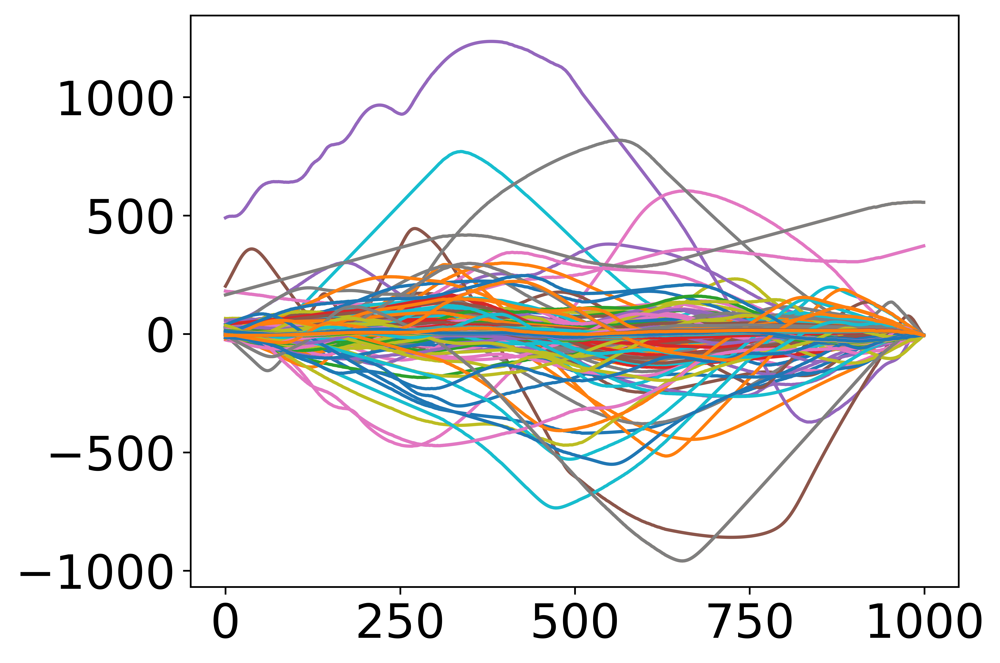

In [30]:
samples_runs = 50
# this will define the computational time

sampler = emcee.EnsembleSampler(nwalkers, ndim, log_post, args = [data_obs])
sampler.run_mcmc(p0, samples_runs) 
samp = sampler.get_chain()

samp_reshaped = samp.reshape(samp.shape[0], -1) #so that the 3D array is reshaped as 2D, to save it 
np.savetxt('samples_emcee.txt',samp_reshaped, delimiter=',')

In [31]:
sampsubset = samp[0:samples_runs,:,:]
samp2d = sampsubset.reshape(sampsubset.shape[0]*sampsubset.shape[1],3)
samp2d.shape
samp2d

np.savetxt('bend4data.txt', np.c_[samp2d])    #year.bend

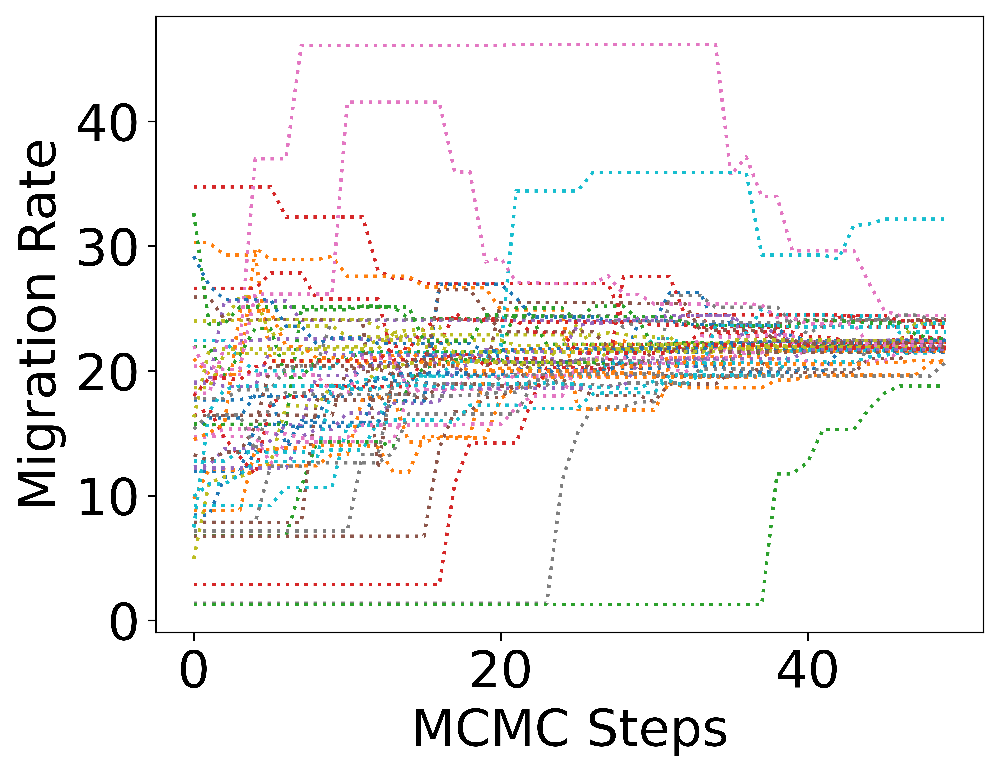

In [32]:
plt.plot(sampler.chain[:,:,0].T, ':')
plt.ylabel("Migration Rate",color='black')
plt.xlabel("MCMC Steps",color='black')


plt.savefig('migrations.PNG',dpi = 200)

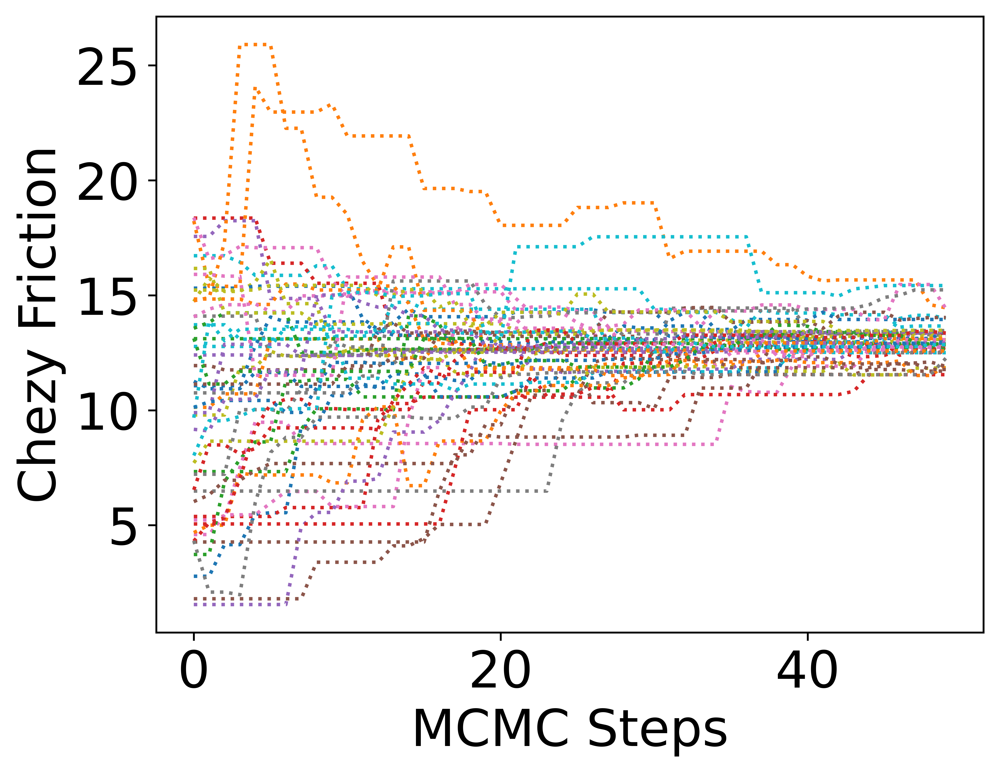

In [33]:
plt.plot(sampler.chain[:,:,1].T, ':')
plt.ylabel("Chezy Friction",color='black')
plt.xlabel("MCMC Steps",color='black')
plt.savefig('migrations.PNG',dpi = 200)

In [34]:
plt.rcParams.update({'font.size': 22}) # must set in top

samp_df = pd.DataFrame(samp2d)
samp_df = samp_df.rename(columns={0: 'migration rate',  1: 'chezy', 2: 'error'})   

samp_df
sns.color_palette("mako")
sns.set(style="ticks")
b = sns.pairplot(samp_df)

plt.savefig('kde%s.PNG',dpi = 300)

100%|███████████████████████████████████████████| 50/50 [00:00<00:00, 79.68it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/327341132.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/327341132.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you 

618929
12079
8992


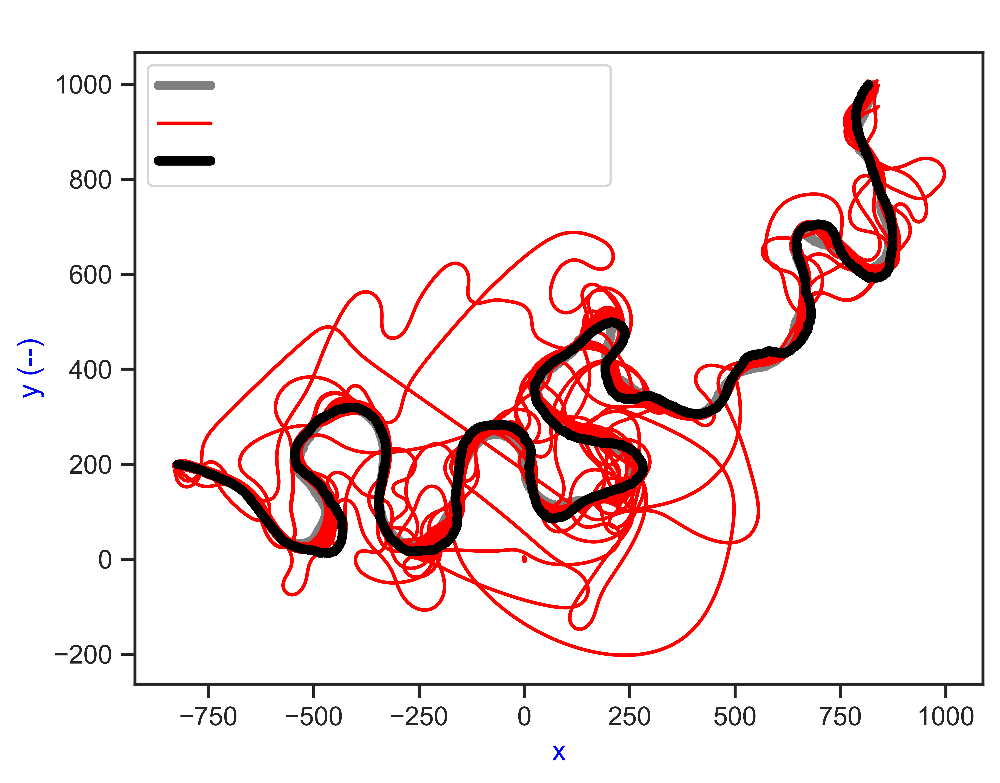

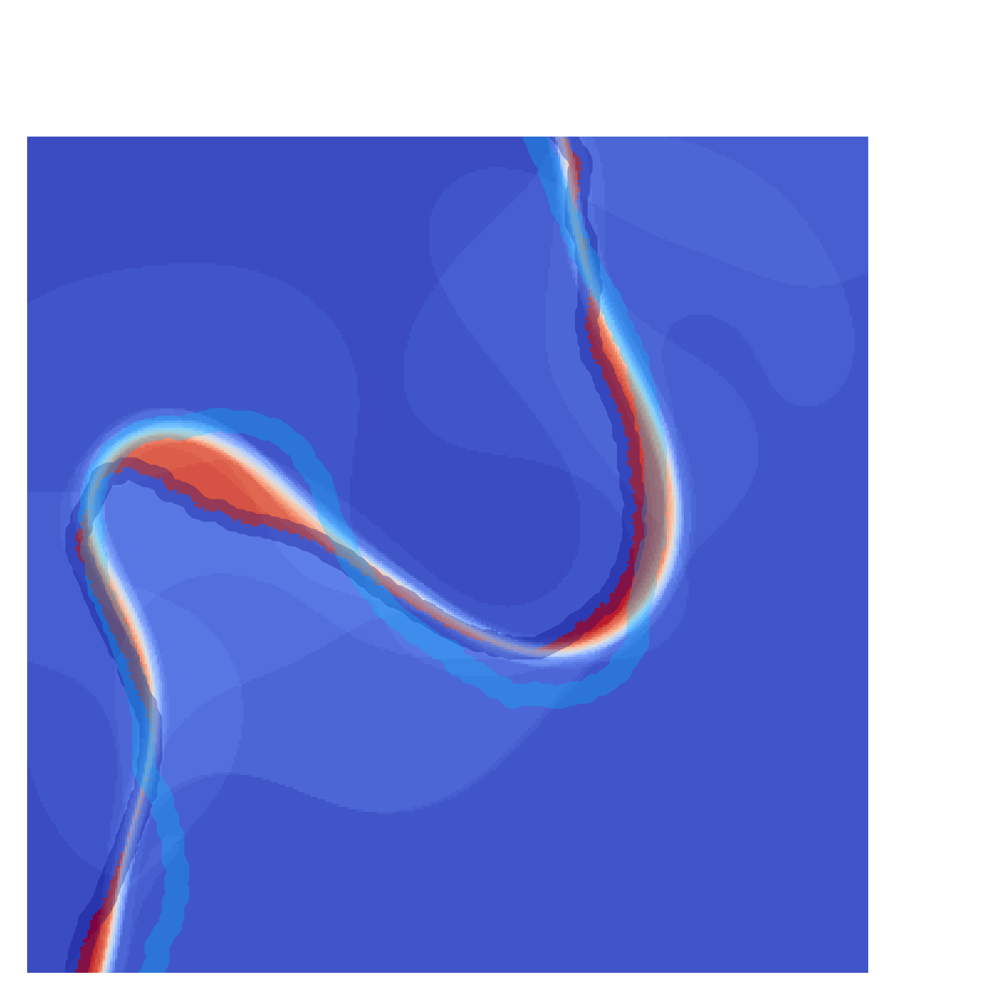

In [48]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend2")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL6.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 50                  
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([420, 760])
plt.ylim([280, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 100/100 [00:01<00:00, 73.86it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/3727048334.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/3727048334.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

605186
13340
21474


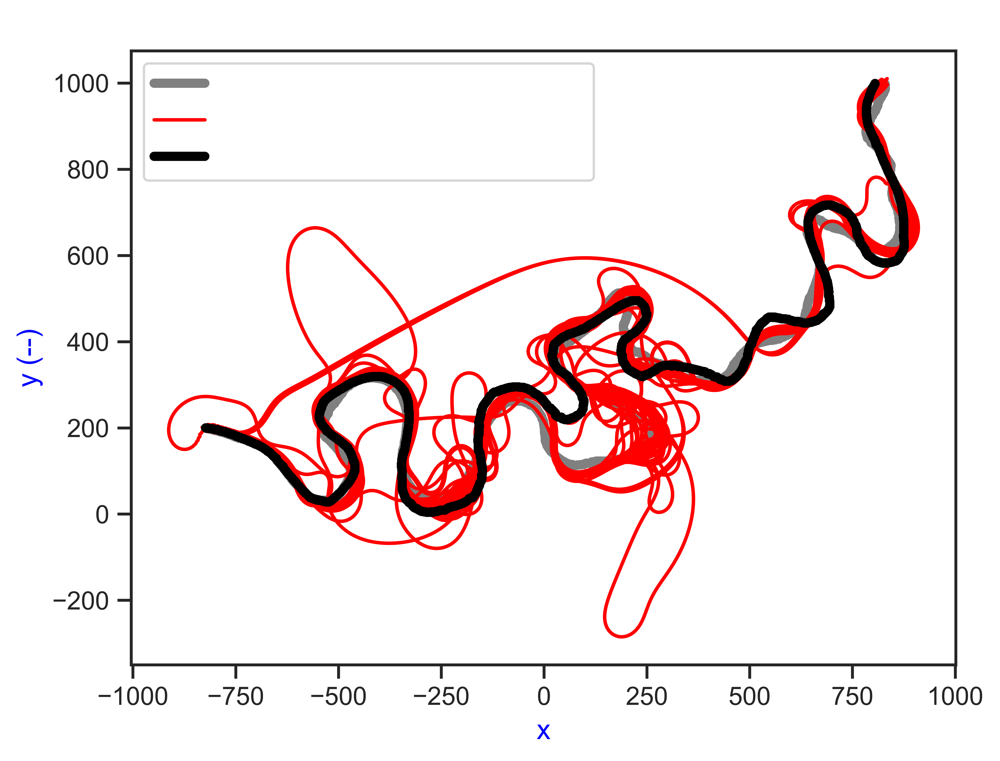

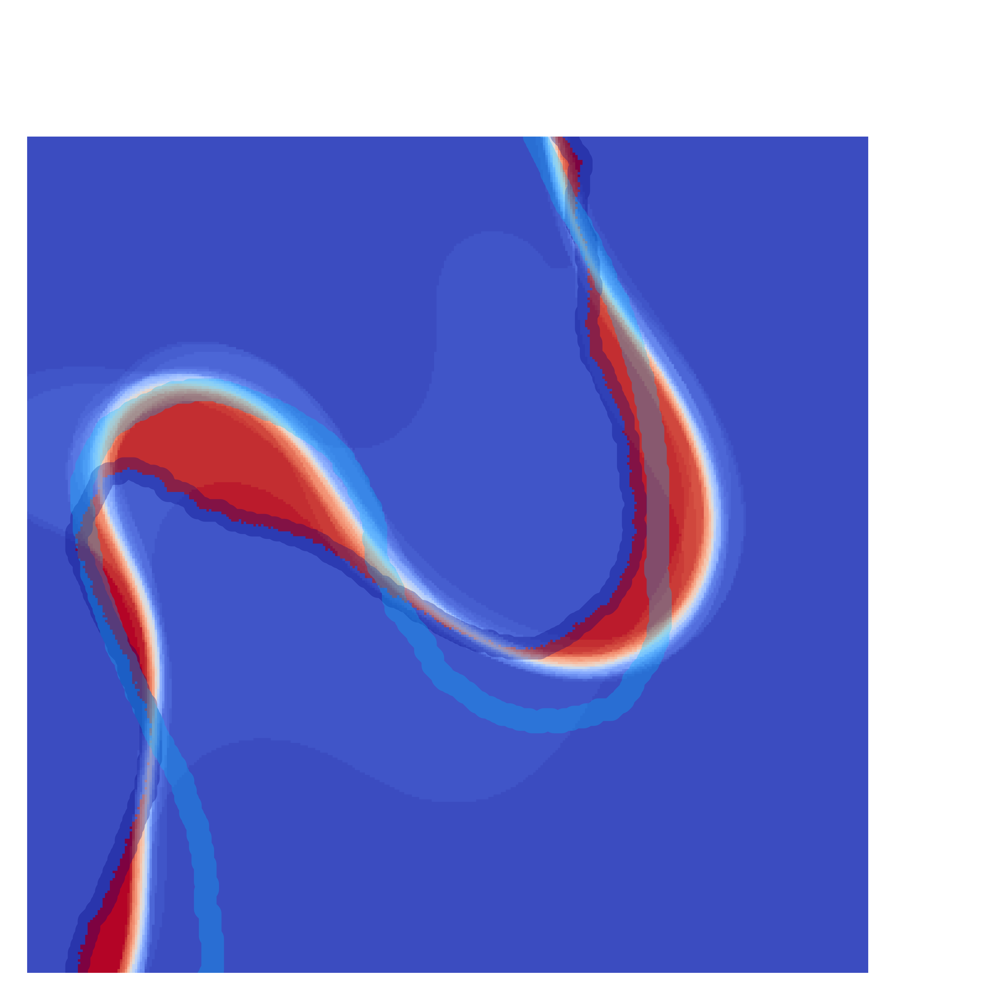

In [49]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend2")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL11.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 100                 
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([420, 760])
plt.ylim([280, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 150/150 [07:18<00:00,  2.92s/it]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/4090431588.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/4090431588.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

589391
19204
31405


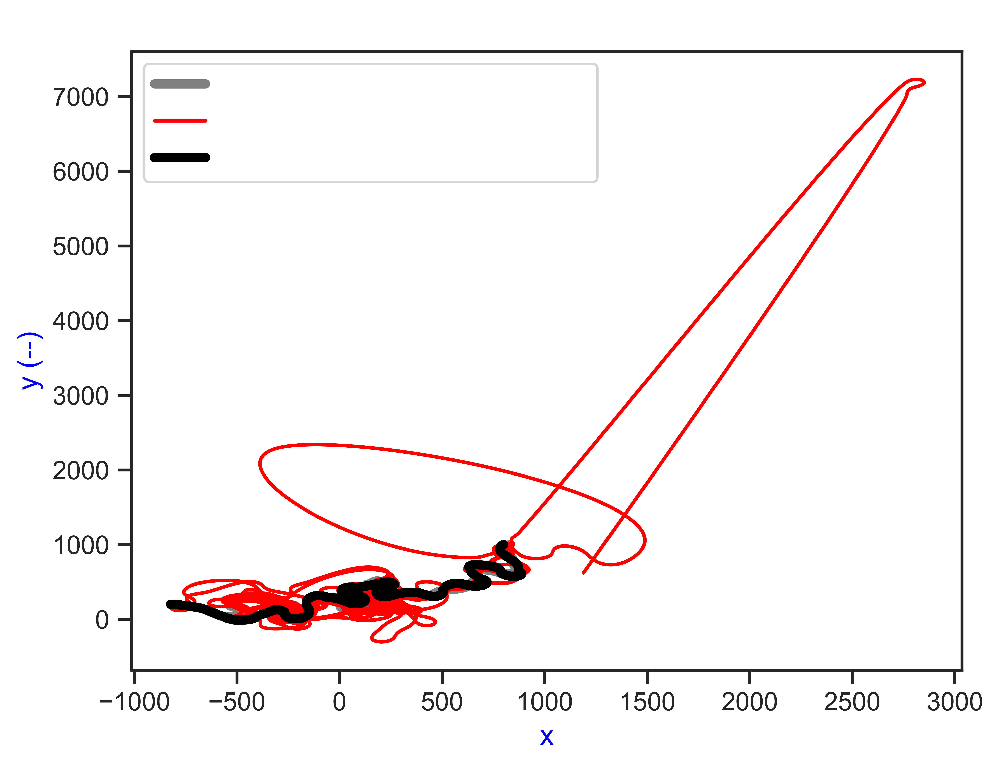

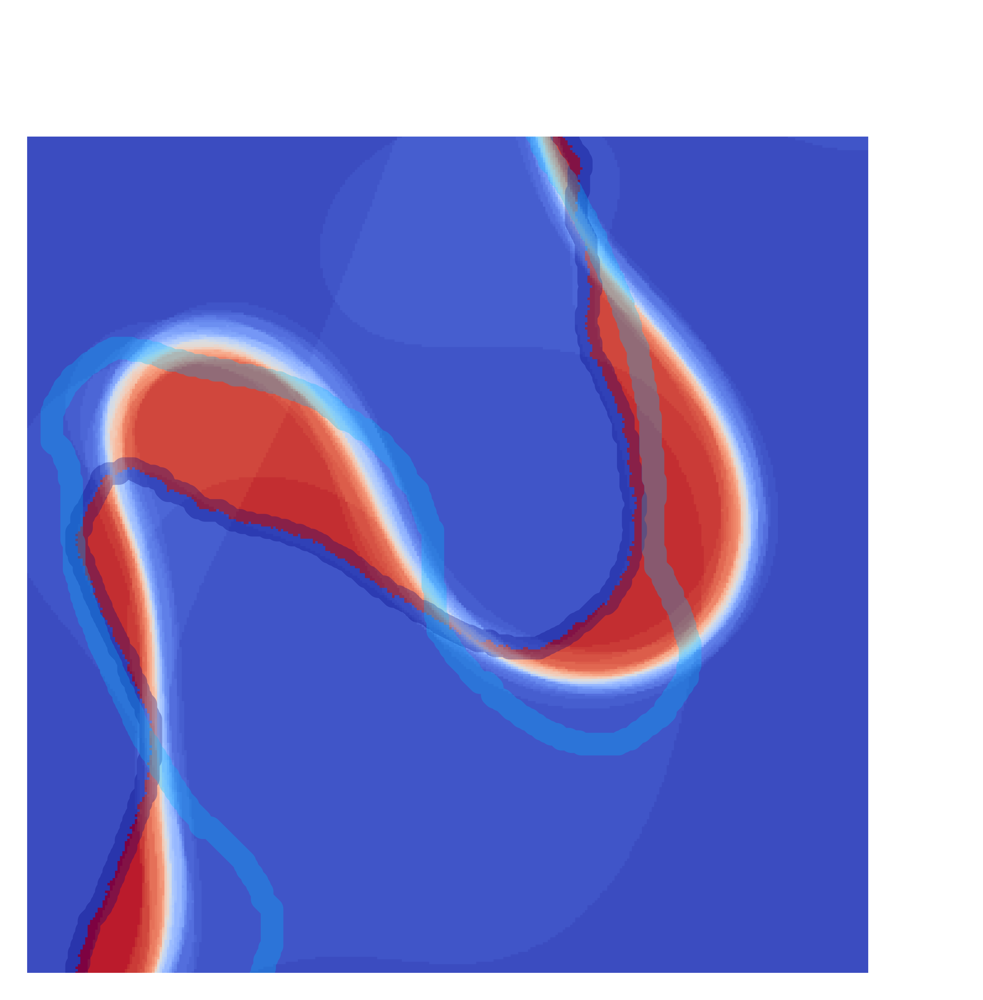

In [50]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend2")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL16.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 150                 
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([420, 760])
plt.ylim([280, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 200/200 [00:02<00:00, 79.50it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/3626914819.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/3626914819.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

575679
26896
37425


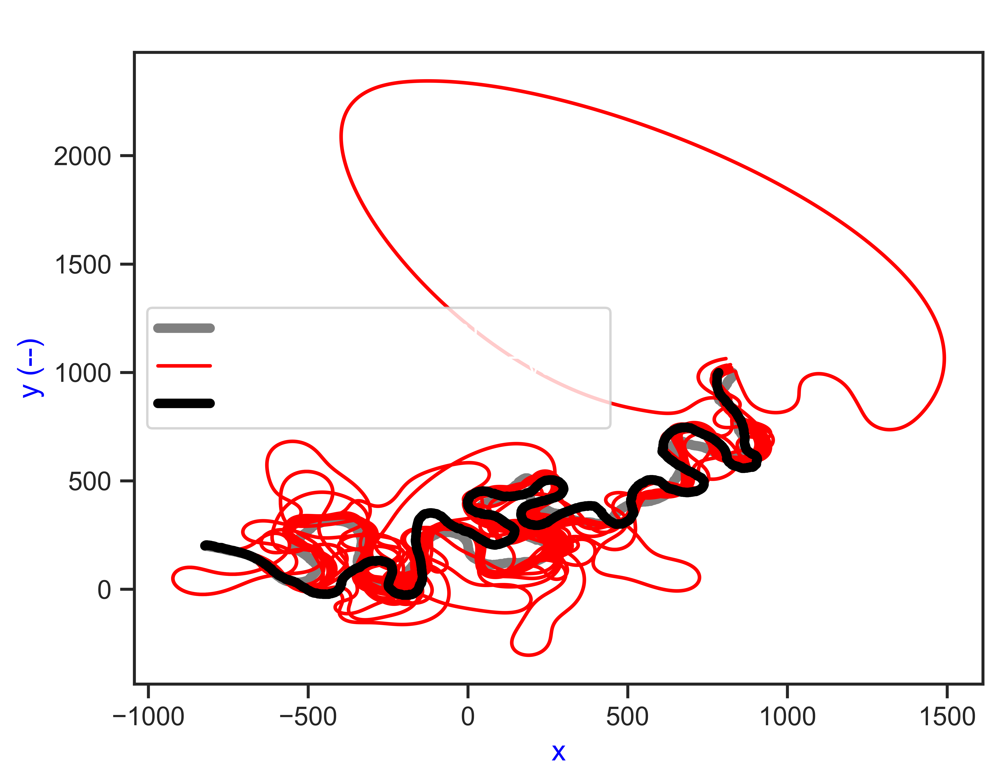

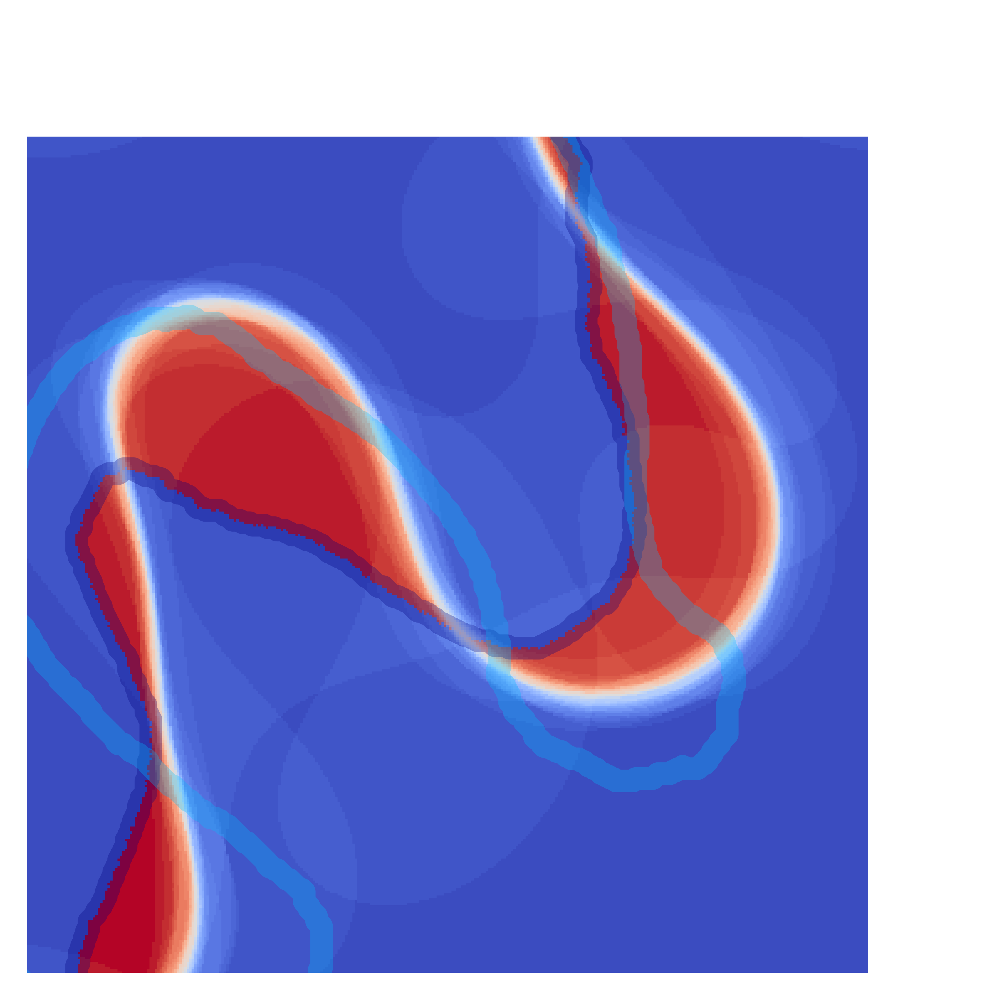

In [51]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend2")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL21.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 200                 
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([420, 760])
plt.ylim([280, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

100%|█████████████████████████████████████████| 250/250 [00:03<00:00, 77.38it/s]
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/2554536622.py:58: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
/var/folders/pv/vxz_z6x905j13byjd_vxl_br0000gn/T/ipykernel_57397/2554536622.py:59: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, yo

564937
31974
43089


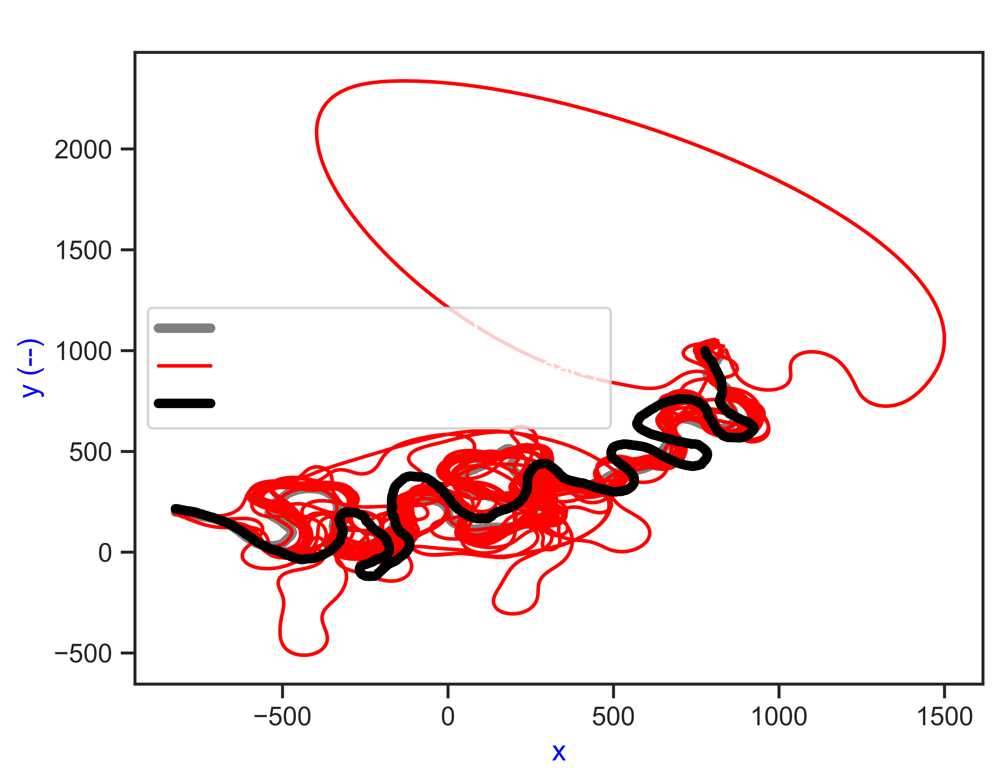

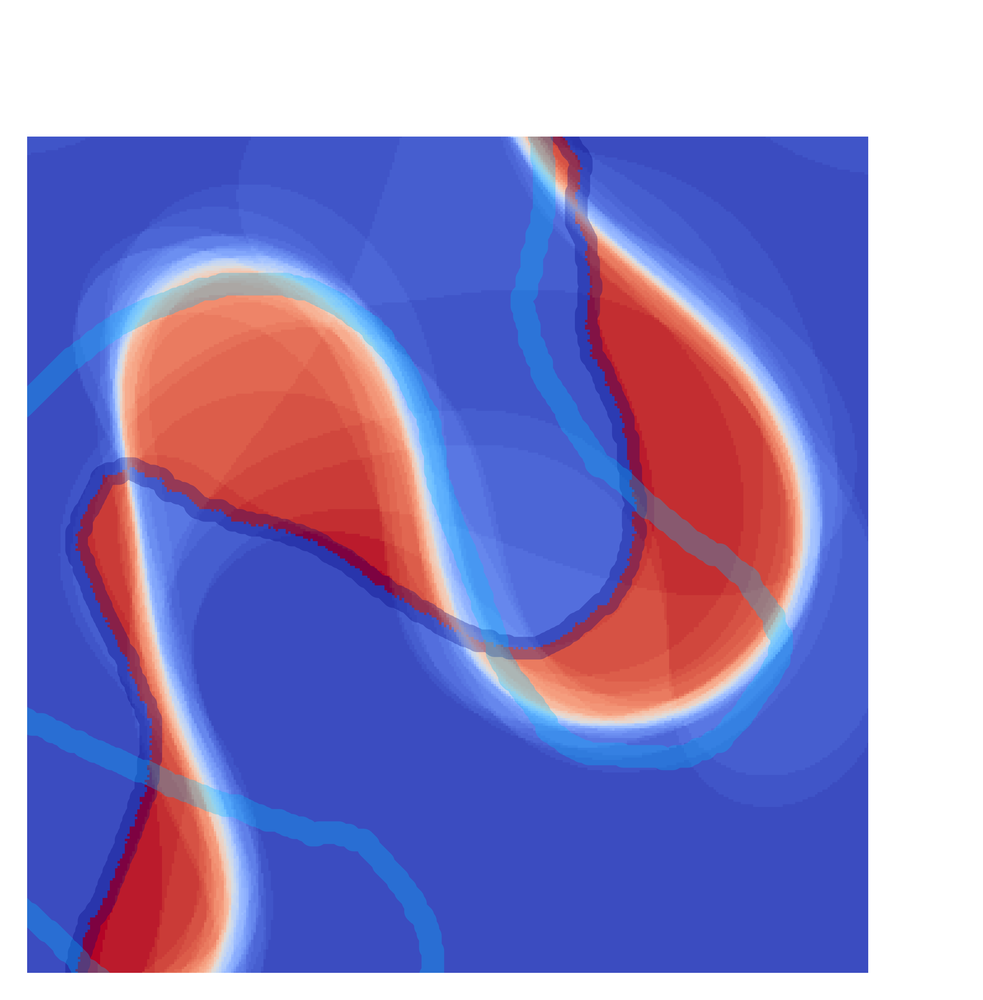

In [54]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend2")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL31.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 250                 
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([420, 760])
plt.ylim([280, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)

In [ ]:
os.chdir(r"/Users/braydennoh/Desktop/meanderpy/january/module2/edit/bend2")
cl1=np.loadtxt('CL1.txt',delimiter=',')
cl0=np.loadtxt('CL1.txt',delimiter=',')

cl2=np.loadtxt('CL31.txt',delimiter=',')
mpl.rcParams['figure.dpi'] = 1000



clin=-cl1+1000
clfi=-cl2+1000
clsyn=np.loadtxt('syn.txt',delimiter=' ')


t = np.linspace(0,1,np.shape(clin[:,])[0]) # create a new variable t 
x_o = clin[:,1].flatten()            # get x-axis data
y_o = clin[:,0].flatten()            # get y-axis data
fx_o = interpolate.interp1d(t,x_o)      # initialize the interpolation class
fy_o = interpolate.interp1d(t, y_o)    
tnew = np.linspace(0,1,10000)                        # create a finer t-variable spacing 
xnew_o = fx_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated x values
ynew_o = fy_o(tnew) + np.random.normal(0,0.2,10000) # get interpolated y values
data_obs_ins = np.array([xnew_o,ynew_o])
data_obs_ins = np.round(data_obs_ins, 5) 
data_obs_ins = np.flip(data_obs_ins, axis=1)      

nit = 300                 
depths = D * np.ones((nit,)) 
pad = 0                 
deltas = 50.0               
crdist = 1.8 * W              
kv =  1.0e-12             
dt = 0.1*(365*24*60*60.0)    
dens = 1000               
saved_ts = 1              
n_bends = 5              
Sl = 0.0            
t1 = 0                  
t2 = 0                  
t3 = 0                # aggradation factor (m/s, about 0.18 m/year, it kicks in after t3) after t3)

def hkm_predict(parm):
    kl =  (parm[0]*10)/(365*24*60*60.0)     # migration rate constant (m/s)
    Cfs = parm[1]*0.001 * np.ones((nit,)) # dimensionless Chezy friction factor
    y=cl1[:,0]*10
    x=cl1[:,1]*10
    z=np.zeros(len(x))
    H=depths[0]
    try:    # use "try" to simulation doesn't stop if there is an error 
        ch=mp.Channel(-x,-y,z,W,H)
        chb=mp.ChannelBelt(channels=[ch], cutoffs=[], cl_times=[0.0], cutoff_times=[])
        ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel
        chb.migrate(nit,saved_ts,deltas,pad,crdist,depths,Cfs,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration

        # create an if loop to discard simulations where the channel geometry 
        #is so sinuous that it has more that 10,000 points
        
        if np.shape(0.1*chb.channels[np.int(nit-1)].x)[0] < 10000:
            t = np.linspace(0,1,np.shape(0.1*chb.channels[np.int(nit-1)].x)[0])
            x_m = (0.1*chb.channels[np.int(nit-1)].x)+1000
            y_m = (0.1*chb.channels[np.int(nit-1)].y)+1000

            fx_m = interpolate.interp1d(t,x_m)
            fy_m = interpolate.interp1d(t, y_m)

            tnew = np.linspace(0,1,10000)
            xnew_m = fx_m(tnew)
            ynew_m = fy_m(tnew)
        
        # create an artificial channel which is a very poor prediction
        else:
            t = np.linspace(0,1,10000)
            xnew_m = np.zeros(10000)
            ynew_m = np.zeros(10000)
    
    # create an artificial channel which is a very poor prediction
    except:
        t = np.linspace(0,1,10000)
        xnew_m = np.zeros(10000)
        ynew_m = np.zeros(10000)
        
        #del chb
    return np.array( [xnew_m,ynew_m])

yss = np.zeros([10000,1000])
del_x = np.linspace(0,1,10000)
for i in range(0,1000):
    yss[:,i]= 1*(np.random.normal(0,1,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,1,1)*np.sin(2*np.pi*del_x))
    
sc=1/1
counts = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt counts
prob = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

counts_obs = np.zeros((int(sc*800),int(sc*800)))  #create variables to store the information abt counts
prob_obs = np.zeros((int(sc*800), int(sc*800))) #create variables to store the information abt proability

ax = pd.DataFrame({"x":clin[:,1], "y":clin[:,0]}).plot.line(x='x', y='y', label='initial actual (0 years)', color='gray',lw=4)

ax.set_xlabel("x (--)")
ax.set_ylabel("y (--)")
ax.set_title("5-year prediction for Ucayali River")

for i in np.random.randint(1500, 2500,50):
    samplenew = samp2d[i,:2]
    sim = hkm_predict(samplenew)
    
    erx = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))
    ery = samp2d[i,2]*(np.random.normal(0,2,1)*np.cos(2*np.pi*del_x)+np.random.normal(0,2,1)*np.sin(2*np.pi*del_x))

     # add the functions to HK model runs
    sim[0,:] = sim[0,:] + erx
    sim[1,:] = sim[1,:] + ery
    
    x = sim[0,:]
    y = sim[1,:]
    
    asdf = np.array([x,y])
    
    np.savetxt('samples_emcee.txt',asdf, delimiter=',')

    pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label='_Hidden')
    
    for j in range(0,int(sc*800)):
        # get the x-values of the river corresponding to the y-value of a certain
        # horizontal line
        idx = np.argwhere(np.diff(np.sign(sim[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        idx_obs = np.argwhere(np.diff(np.sign(data_obs_ins[1,:] - np.arange(200,1000,1/sc)[j]))).flatten() 
        
        #ax1.plot(x[idx], y[idx], 'ro')
        intersection = sim[0,idx]
        intersection_obs = data_obs_ins[0,idx_obs]

        
        #ax1.set_xticks(np.arange(-20, 21, 2))
        #ax1.set_yticks(np.arange(-20, 21, 2))   

        for k in range(0,int(sc*800)):
            # count the intersection points on the left side of the grid cell
            counts[k,j]= np.shape(intersection[intersection<=np.arange(200,1000,1/sc)[k]])[0]
            counts_obs[k,j]= np.shape(intersection_obs[intersection_obs<=np.arange(200,1000,1/sc)[k]])[0]
    
    counts = np.absolute(counts-counts_obs)
    #counts = (counts-counts_obs)
    counts[counts%2 == 1] = 1 # erosion happened i.e. = 1 if count number even
    counts[counts%2 == 0] = 0 # no erosion i.e. = 0 if count number off
    #counts[counts != 0] = 1 # erosion happened i.e. = 1 if count number even
    
    prob = prob + counts  # add up all the "monte carlo" runs that pass the grid cell
    
pd.DataFrame({"x":sim[0,:], "y":sim[1,:]}).plot.line(x='x', y='y', ax= ax, color='red',label="probabilistic prediction (5 years)")
pd.DataFrame({"x":clfi[:,1], "y":clfi[:,0]}).plot.line(x='x', y='y', ax= ax, label='final actual (5 years)',color='black',lw=4)
plt.savefig('prob_prediction.jpg')

prob = prob/50
  
y, x = np.meshgrid(np.arange(0,800,1/sc), np.arange(0,800,1/sc))

z = prob

z_min, z_max = 0, np.abs(z).max()

fig, ax = plt.subplots(figsize=(4,4))

c = ax.pcolormesh(x, y, z, cmap="coolwarm", vmin=z_min, vmax=z_max)
#fig.colorbar(c, ax=ax)
fig.legend('',frameon=False)
plt.xlim([420, 760])
plt.ylim([280, 620])

mpl.rcParams.update({'text.color' : "white",
                     'axes.labelcolor' : "blue"})

d = z.ravel()
plt.axis('off')
pd.DataFrame({"x":-cl0[:,1]+800, "y":-cl0[:,0]+800}).plot.line(x='x', y='y', ax= ax,  color='navy',lw = 6,alpha=0.3,label='initial actual (0 years)')
pd.DataFrame({"x":-cl2[:,1]+800, "y":-cl2[:,0]+800}).plot.line(x='x', y='y',   color='#00BFFF',lw = 6,alpha=0.3,ax= ax,label='final actual (5 years)')
plt.legend(frameon=False,labelcolor='white',loc="upper left")
plt.legend('',frameon=False)

p1 = ((0 <= d) & (d <= 0.25)).sum()
p2 = ((0.25 <= d) & (d <= 0.75)).sum()
p3 = ((0.75 <= d) & (d <= 1)).sum()

print (p1)
print (p2)
print (p3)

fig.savefig('risk%s.PNG'% i,dpi = 200)